## Setting Up the Environment

In [1]:
# Install packages
!pip install tensorflow albumentations opencv-python matplotlib tqdm scikit-learn

In [38]:
# Import libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models, applications, callbacks, optimizers
import cv2
import zipfile
import io
import random
from tqdm import tqdm
import shutil
from tqdm import tqdm
import albumentations as A
from tensorflow.keras.utils import Sequence
from sklearn.metrics import confusion_matrix, precision_recall_curve,average_precision_score
from tensorflow.keras.utils import plot_model

In [3]:
# Set random seeds
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)
random.seed(SEED)

In [4]:
print("TensorFlow version:", tf.__version__)
print("GPU Available: ", len(tf.config.list_physical_devices('GPU')) > 0)

TensorFlow version: 2.18.0
GPU Available:  True


Mixed precision training with `mixed_float16` combines 16-bit and 32-bit floating-point numerics, leveraging float16 for computational efficiency in forward and backward passes while retaining float32 precision for critical operations like weight updates to maintain numerical stability. This approach reduces memory bandwidth, accelerates computation, and preserves model accuracy by minimizing precision loss.

In [5]:
tf.keras.mixed_precision.set_global_policy('float32')
print("Mixed precision disabled (using float32).")

Mixed precision disabled (using float32).


In [ ]:
try:
    policy = tf.keras.mixed_precision.Policy('mixed_float16')
    tf.keras.mixed_precision.set_global_policy(policy)
    print('Mixed precision enabled')
except:
    print('Mixed precision not available')

Mixed precision enabled


## Downloading and Preparing the Dataset

In [6]:
from google.colab import files
uploaded = files.upload()

Saving ocean_waste.v1i.yolov8.zip to ocean_waste.v1i.yolov8.zip


In [7]:
import zipfile
import os

# Directory for the dataset
os.makedirs('ocean_waste_dataset', exist_ok=True)

# Extract the zip file
with zipfile.ZipFile('ocean_waste.v1i.yolov8.zip', 'r') as zip_ref:
    zip_ref.extractall('ocean_waste_dataset')

# Check the contents
!ls -la ocean_waste_dataset


total 32
drwxr-xr-x 5 root root 4096 May  1 15:44 .
drwxr-xr-x 1 root root 4096 May  1 15:44 ..
-rw-r--r-- 1 root root  406 May  1 15:44 data.yaml
-rw-r--r-- 1 root root  145 May  1 15:44 README.dataset.txt
-rw-r--r-- 1 root root  988 May  1 15:44 README.roboflow.txt
drwxr-xr-x 4 root root 4096 May  1 15:44 test
drwxr-xr-x 4 root root 4096 May  1 15:44 train
drwxr-xr-x 4 root root 4096 May  1 15:44 valid


## Data Exploration and Visualisation

In [8]:
# Basic folder check
def explore_dataset_structure(dataset_path):
    print("\n=== Dataset Structure ===")

    # List all folders/files in the main dataset directory
    main_dirs = os.listdir(dataset_path)
    print(f"Main directories: {main_dirs}")

    return main_dirs
main_dirs = explore_dataset_structure('ocean_waste_dataset')


=== Dataset Structure ===
Main directories: ['valid', 'train', 'test', 'README.roboflow.txt', 'README.dataset.txt', 'data.yaml']


In [9]:
#  Check contents of train, valid, test folders
for split in ['train', 'valid', 'test']:
    if split in main_dirs:
        split_path = os.path.join('ocean_waste_dataset', split)
        print(f"\nContents of '{split}' folder:")
        print(os.listdir(split_path))

        # Count images
        images_path = os.path.join(split_path, 'images')
        if os.path.exists(images_path):
            num_images = len(os.listdir(images_path))
            print(f"Number of images: {num_images}")

        # Count labels
        labels_path = os.path.join(split_path, 'labels')
        if os.path.exists(labels_path):
            num_labels = len(os.listdir(labels_path))
            print(f"Number of labels: {num_labels}")


Contents of 'train' folder:
['labels', 'images']
Number of images: 3628
Number of labels: 3628

Contents of 'valid' folder:
['labels', 'images']
Number of images: 1007
Number of labels: 1007

Contents of 'test' folder:
['labels', 'images']
Number of images: 501
Number of labels: 501


In [10]:
# inside data.yaml
yaml_path = os.path.join('ocean_waste_dataset', 'data.yaml')

if os.path.exists(yaml_path):
    with open(yaml_path, 'r') as f:
        content = f.read()
        print("\nContents of data.yaml:\n")
        print(content)


Contents of data.yaml:

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 15
names: ['Mask', 'can', 'cellphone', 'electronics', 'gbottle', 'glove', 'metal', 'misc', 'net', 'pbag', 'pbottle', 'plastic', 'rod', 'sunglasses', 'tire']

roboflow:
  workspace: object-detect-dmjpt
  project: ocean_waste
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/object-detect-dmjpt/ocean_waste/dataset/1


In [11]:
# Extract class names from data.yaml
class_mapping = {}
yaml_path = os.path.join('ocean_waste_dataset', 'data.yaml')

if os.path.exists(yaml_path):
    with open(yaml_path, 'r') as f:
        for line in f:
            if 'names:' in line:
                class_names_str = line.split('names:')[1].strip()
                try:
                    class_names = eval(class_names_str)
                    class_mapping = {i: name for i, name in enumerate(class_names)}
                except:
                    print("Could not parse class names.")

# Fallback if nothing was parsed
if not class_mapping:
    class_mapping = {0: 'trash'}
    print("Using default class mapping: {0: 'trash'}")

print("Class Mapping:")
for class_id, class_name in class_mapping.items():
    print(f"{class_id}: {class_name}")

Class Mapping:
0: Mask
1: can
2: cellphone
3: electronics
4: gbottle
5: glove
6: metal
7: misc
8: net
9: pbag
10: pbottle
11: plastic
12: rod
13: sunglasses
14: tire


In [12]:
# This will calculate how many times each class appears in train/valid/test
class_counts = {split: {class_id: 0 for class_id in class_mapping} for split in ['train', 'valid', 'test']}

for split in ['train', 'valid', 'test']:
    labels_path = os.path.join('ocean_waste_dataset', split, 'labels')
    if not os.path.exists(labels_path):
        continue

    for file in os.listdir(labels_path):
        with open(os.path.join(labels_path, file), 'r') as f:
            lines = f.readlines()
            for line in lines:
                parts = line.strip().split()
                if len(parts) == 5:
                    class_id = int(parts[0])
                    if class_id in class_counts[split]:
                        class_counts[split][class_id] += 1

In [13]:

# Count class instances in each split

print("\n=== Class Distribution Summary ===")

for split in ['train', 'valid', 'test']:
    print(f"\n {split.capitalize()} Set:")

    split_counts = class_counts[split]
    total = sum(split_counts.values())

    print(f"Total annotations: {total}")
    print(f"{'ID':<3} {'Class Name':<15} {'Count':<6} {'% of Total':<10}")
    print("-" * 40)

    for class_id in sorted(split_counts):
        name = class_mapping.get(class_id, f"Class {class_id}")
        count = split_counts[class_id]
        percent = (count / total) * 100 if total > 0 else 0
        print(f"{class_id:<3} {name:<15} {count:<6} {percent:>7.2f}%")


=== Class Distribution Summary ===

 Train Set:
Total annotations: 8802
ID  Class Name      Count  % of Total
----------------------------------------
0   Mask            1445     16.42%
1   can             124       1.41%
2   cellphone       268       3.04%
3   electronics     137       1.56%
4   gbottle         339       3.85%
5   glove           1172     13.32%
6   metal           56        0.64%
7   misc            173       1.97%
8   net             531       6.03%
9   pbag            1135     12.89%
10  pbottle         932      10.59%
11  plastic         176       2.00%
12  rod             26        0.30%
13  sunglasses      14        0.16%
14  tire            2274     25.84%

 Valid Set:
Total annotations: 1909
ID  Class Name      Count  % of Total
----------------------------------------
0   Mask            92        4.82%
1   can             20        1.05%
2   cellphone       71        3.72%
3   electronics     40        2.10%
4   gbottle         82        4.30%
5   glove   

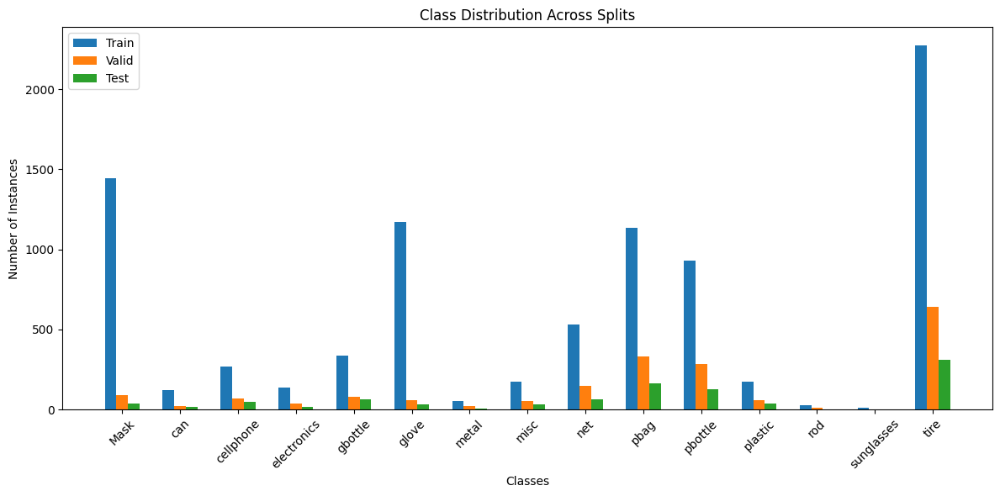

In [14]:
# Plot class distribution
x = np.arange(len(class_mapping))
splits = ['train', 'valid', 'test']
width = 0.2

plt.figure(figsize=(12, 6))

for i, split in enumerate(splits):
    counts = [class_counts[split][cid] for cid in class_mapping]
    plt.bar(x + i * width, counts, width, label=split.capitalize())

plt.xticks(x + width, [class_mapping[cid] for cid in class_mapping], rotation=45)
plt.xlabel("Classes")
plt.ylabel("Number of Instances")
plt.title("Class Distribution Across Splits")
plt.legend()
plt.tight_layout()
plt.show()

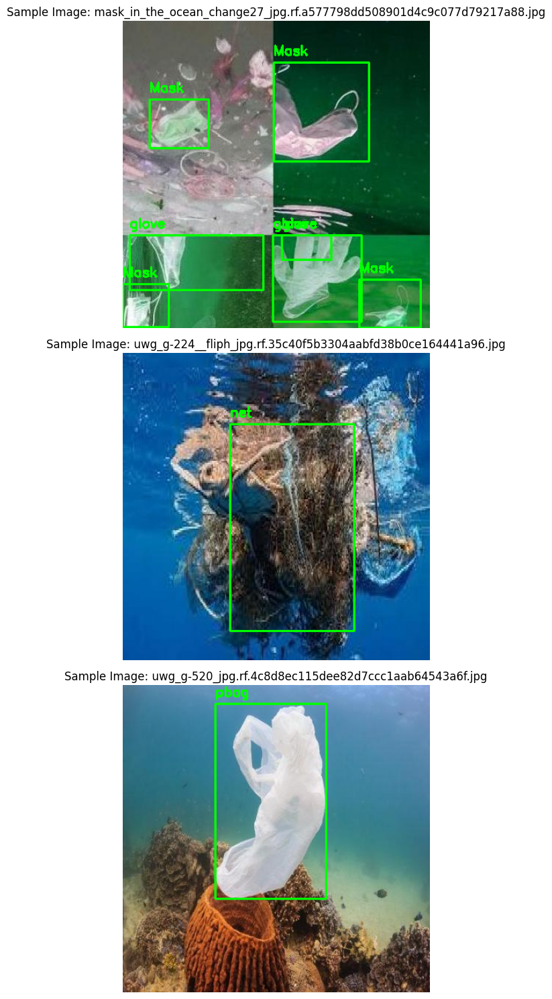

In [15]:
# Visualize images with bounding boxes

def visualize_yolo_samples(dataset_path, class_mapping, num_samples=3):
    image_dir = os.path.join(dataset_path, 'train', 'images')
    label_dir = os.path.join(dataset_path, 'train', 'labels')

    if not os.path.exists(image_dir) or not os.path.exists(label_dir):
        print("Train images or labels not found.")
        return

    image_files = os.listdir(image_dir)
    random.shuffle(image_files)

    plt.figure(figsize=(15, 5 * num_samples))

    for i, image_file in enumerate(image_files[:num_samples]):
        image_path = os.path.join(image_dir, image_file)
        label_path = os.path.join(label_dir, image_file.replace('.jpg', '.txt'))

        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        height, width = image.shape[:2]

        # Draw boxes
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) == 5:
                        cls_id, x, y, w, h = map(float, parts)
                        x1 = int((x - w / 2) * width)
                        y1 = int((y - h / 2) * height)
                        x2 = int((x + w / 2) * width)
                        y2 = int((y + h / 2) * height)

                        class_name = class_mapping.get(int(cls_id), str(cls_id))
                        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
                        cv2.putText(image, class_name, (x1, y1 - 10),
                                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

        plt.subplot(num_samples, 1, i + 1)
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"Sample Image: {image_file}")

    plt.tight_layout()
    plt.show()


visualize_yolo_samples('ocean_waste_dataset', class_mapping, num_samples=3)

## Converting YOLO Format to Segmentation Masks
Now we'll convert the YOLO format bounding boxes to segmentation masks for U-Net
training.

In [16]:
# Parsing YOLO label into bounding box coordinates
def parse_yolo_label(label_path, image_width, image_height):
    """
    Convert YOLO bounding box format to pixel coordinates.
    Returns a list of dictionaries: each box with x1, y1, x2, y2.
    """
    boxes = []
    with open(label_path, 'r') as f:
        lines = f.readlines()
        for line in lines:
            parts = line.strip().split()
            if len(parts) == 5:
                class_id = int(parts[0])
                x_center = float(parts[1]) * image_width
                y_center = float(parts[2]) * image_height
                width = float(parts[3]) * image_width
                height = float(parts[4]) * image_height

                x1 = int(x_center - width / 2)
                y1 = int(y_center - height / 2)
                x2 = int(x_center + width / 2)
                y2 = int(y_center + height / 2)

                boxes.append({
                    'class_id': class_id,
                    'x1': max(0, x1),
                    'y1': max(0, y1),
                    'x2': min(image_width, x2),
                    'y2': min(image_height, y2)
                })
    return boxes

In [17]:
# Creating a segmentation mask from the bounding boxes
def create_segmentation_mask(image_path, label_path):
    """
    Create binary segmentation mask: 1 for object, 0 for background.
    """
    image = cv2.imread(image_path)
    height, width = image.shape[:2]

    # Start with a blank (all zeros) mask
    mask = np.zeros((height, width), dtype=np.uint8)

    # Get bounding boxes
    boxes = parse_yolo_label(label_path, width, height)

    # Fill in object areas as 1
    for box in boxes:
        x1, y1, x2, y2 = box['x1'], box['y1'], box['x2'], box['y2']
        mask[y1:y2, x1:x2] = 1

    return mask

In [18]:
# Full YOLO dataset conversion function
def prepare_segmentation_dataset(yolo_dataset_path, output_path, img_size=(512, 512)):
    """
    Convert YOLO dataset into image/mask format for segmentation.
    """
    os.makedirs(output_path, exist_ok=True)

    for split in ['train', 'valid', 'test']:
        split_dir = os.path.join(output_path, split)
        os.makedirs(os.path.join(split_dir, 'images'), exist_ok=True)
        os.makedirs(os.path.join(split_dir, 'masks'), exist_ok=True)

        src_img_dir = os.path.join(yolo_dataset_path, split, 'images')
        src_lbl_dir = os.path.join(yolo_dataset_path, split, 'labels')

        if not os.path.exists(src_img_dir) or not os.path.exists(src_lbl_dir):
            print(f"{split} folder missing, skipping.")
            continue

        image_files = [f for f in os.listdir(src_img_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
        print(f"Processing {split} - {len(image_files)} images")

        for image_file in tqdm(image_files):
            image_path = os.path.join(src_img_dir, image_file)
            label_file = os.path.splitext(image_file)[0] + '.txt'
            label_path = os.path.join(src_lbl_dir, label_file)

            if not os.path.exists(label_path):
                continue

            # Create mask
            mask = create_segmentation_mask(image_path, label_path)

            # Read and resize image and mask
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, img_size)
            mask = cv2.resize(mask, img_size, interpolation=cv2.INTER_NEAREST)

            # Save output
            dst_img_path = os.path.join(split_dir, 'images', image_file)
            dst_msk_path = os.path.join(split_dir, 'masks', os.path.splitext(image_file)[0] + '.png')
            cv2.imwrite(dst_img_path, cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
            cv2.imwrite(dst_msk_path, mask * 255)  # Scale mask for visibility

    # Copy the original data.yaml
    yaml_src = os.path.join(yolo_dataset_path, 'data.yaml')
    if os.path.exists(yaml_src):
        shutil.copy(yaml_src, os.path.join(output_path, 'data.yaml'))

    print(f"\n Dataset saved to: {output_path}")
    return output_path

In [19]:
segmentation_dataset_path = prepare_segmentation_dataset(
    yolo_dataset_path='ocean_waste_dataset',
    output_path='ocean_waste_segmentation',
    img_size=(512, 512)
)

Processing train - 3628 images


100%|██████████| 3628/3628 [00:16<00:00, 215.24it/s]


Processing valid - 1007 images


100%|██████████| 1007/1007 [00:04<00:00, 219.63it/s]


Processing test - 501 images


100%|██████████| 501/501 [00:02<00:00, 219.40it/s]


 Dataset saved to: ocean_waste_segmentation


In [20]:
# Visualize the generated results
def visualize_segmentation_samples(dataset_path, num_samples=3):
    """
    Show images, masks, and overlay for random samples.
    """
    splits = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]

    plt.figure(figsize=(15, 5 * len(splits) * num_samples))

    for i, split in enumerate(splits):
        img_dir = os.path.join(dataset_path, split, 'images')
        msk_dir = os.path.join(dataset_path, split, 'masks')
        image_files = [f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

        if not image_files:
            continue

        random.shuffle(image_files)
        selected = image_files[:num_samples]

        for j, img_file in enumerate(selected):
            image = cv2.imread(os.path.join(img_dir, img_file))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            mask = cv2.imread(os.path.join(msk_dir, os.path.splitext(img_file)[0] + '.png'), cv2.IMREAD_GRAYSCALE)
            mask = mask / 255.0  # Normalize mask

            overlay = image.copy()
            overlay[mask > 0.5] = [255, 0, 0]  # Red mask for object
            blended = cv2.addWeighted(image, 0.7, overlay, 0.3, 0)

            idx = i * num_samples + j
            plt.subplot(len(splits) * num_samples, 3, idx * 3 + 1)
            plt.imshow(image)
            plt.title(f"{split} - Image")
            plt.axis('off')

            plt.subplot(len(splits) * num_samples, 3, idx * 3 + 2)
            plt.imshow(mask, cmap='gray')
            plt.title(f"{split} - Mask")
            plt.axis('off')

            plt.subplot(len(splits) * num_samples, 3, idx * 3 + 3)
            plt.imshow(blended)
            plt.title(f"{split} - Overlay")
            plt.axis('off')

    plt.tight_layout()
    plt.show()

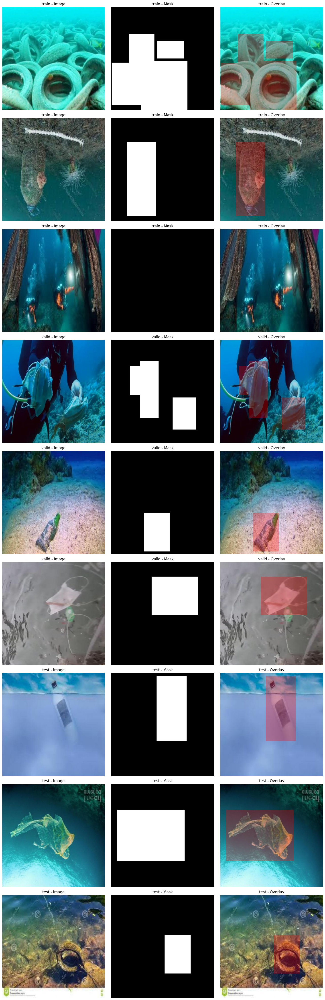

In [ ]:
visualize_segmentation_samples(segmentation_dataset_path, num_samples=3)

The conversion process transforms YOLO bounding box annotations (normalized center coordinates, width, height) into binary segmentation masks by mapping normalized values to pixel coordinates and assigning 1 to all foreground regions (trash objects) and 0 to background. Class-agnostic masks are generated by treating all object classes as a single unified category.

## Creating Data Generators

In [21]:
class SegmentationDataGenerator(Sequence):
    def __init__(self, dataset_path, split='train', batch_size=8,
                 img_size=(512, 512), backbone='vgg16', augment=False, shuffle=True):
        self.dataset_path = dataset_path
        self.split = split
        self.batch_size = batch_size
        self.backbone = backbone
        self.augment = augment
        self.shuffle = shuffle

        # Adjust image size depending on the model architecture
        if backbone == 'inception_v3':
            self.img_size = (299, 299)
        elif backbone in ['vgg16', 'resnet50', 'convnext']:
            self.img_size = (224, 224)
        else:
            self.img_size = img_size

        # Set paths to images and masks
        self.images_dir = os.path.join(dataset_path, split, 'images')
        self.masks_dir = os.path.join(dataset_path, split, 'masks')
        self.image_files = [f for f in os.listdir(self.images_dir) if f.endswith(('.jpg', '.png'))]

        # Define augmentations
        if self.augment:
            self.aug_pipeline = A.Compose([
                A.HorizontalFlip(p=0.5),
                A.VerticalFlip(p=0.3),
                A.RandomRotate90(p=0.5),
                A.RandomBrightnessContrast(p=0.3),
                A.GaussianBlur(blur_limit=(3, 5), p=0.2),
                A.GaussNoise(var_limit=(10.0, 50.0), p=0.2),
                A.ColorJitter(p=0.3),
                A.OneOf([
                    A.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=0.5),
                    A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=15, val_shift_limit=10, p=0.5)
                ], p=0.3),
            ])

        self.indices = np.arange(len(self.image_files))
        if self.shuffle:
            np.random.shuffle(self.indices)


    def __len__(self):
        return int(np.ceil(len(self.image_files) / self.batch_size))

    def __getitem__(self, idx):
        batch_indices = self.indices[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_files = [self.image_files[i] for i in batch_indices]

        batch_images = np.zeros((len(batch_files), *self.img_size, 3), dtype=np.float32)
        batch_masks = np.zeros((len(batch_files), *self.img_size, 1), dtype=np.float32)

        for i, file in enumerate(batch_files):
            img_path = os.path.join(self.images_dir, file)
            mask_path = os.path.join(self.masks_dir, os.path.splitext(file)[0] + '.png')

            image = cv2.imread(img_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE) / 255.0
            mask = np.expand_dims(mask, axis=-1)

            if self.augment:
                augmented = self.aug_pipeline(image=image, mask=mask)
                image, mask = augmented['image'], augmented['mask']

            image = cv2.resize(image, self.img_size)
            mask = cv2.resize(mask, self.img_size, interpolation=cv2.INTER_NEAREST)

            # Ensure the mask has the expected number of channels
            mask = np.expand_dims(mask, axis=-1)

            batch_images[i] = image / 255.0
            batch_masks[i] = mask

        return batch_images, batch_masks

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)

In [22]:
def create_data_generators(dataset_path, batch_size=8, backbone='vgg16'):
    if backbone == 'inception_v3':
        IMG_SIZE = (299, 299)
    elif backbone in ['vgg16', 'resnet50', 'convnext']:
        IMG_SIZE = (224, 224)
    else:
        IMG_SIZE = (512, 512)

    train_gen = SegmentationDataGenerator(dataset_path, 'train', batch_size, IMG_SIZE, backbone, augment=True)
    val_gen = SegmentationDataGenerator(dataset_path, 'valid', batch_size, IMG_SIZE, backbone, augment=False)
    test_gen = SegmentationDataGenerator(dataset_path, 'test', batch_size, IMG_SIZE, backbone, augment=False)
    return train_gen, val_gen, test_gen


In [23]:
def visualize_batch(generator, num_samples=3):
    images, masks = next(iter(generator))
    plt.figure(figsize=(12, 4 * num_samples))
    for i in range(num_samples):
        plt.subplot(num_samples, 3, i*3+1)
        plt.imshow(images[i])
        plt.title("Image")
        plt.axis('off')

        plt.subplot(num_samples, 3, i*3+2)
        plt.imshow(masks[i, :, :, 0], cmap='gray')
        plt.title("Mask")
        plt.axis('off')

        overlay = images[i].copy()
        overlay[masks[i, :, :, 0] > 0.5] = [1, 0, 0]
        plt.subplot(num_samples, 3, i*3+3)
        plt.imshow(overlay)
        plt.title("Overlay")
        plt.axis('off')
    plt.tight_layout()
    plt.show()



Backbone: vgg16
Train batches: 454


<ipython-input-21-ee22b2ca25cc>:32: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.2),


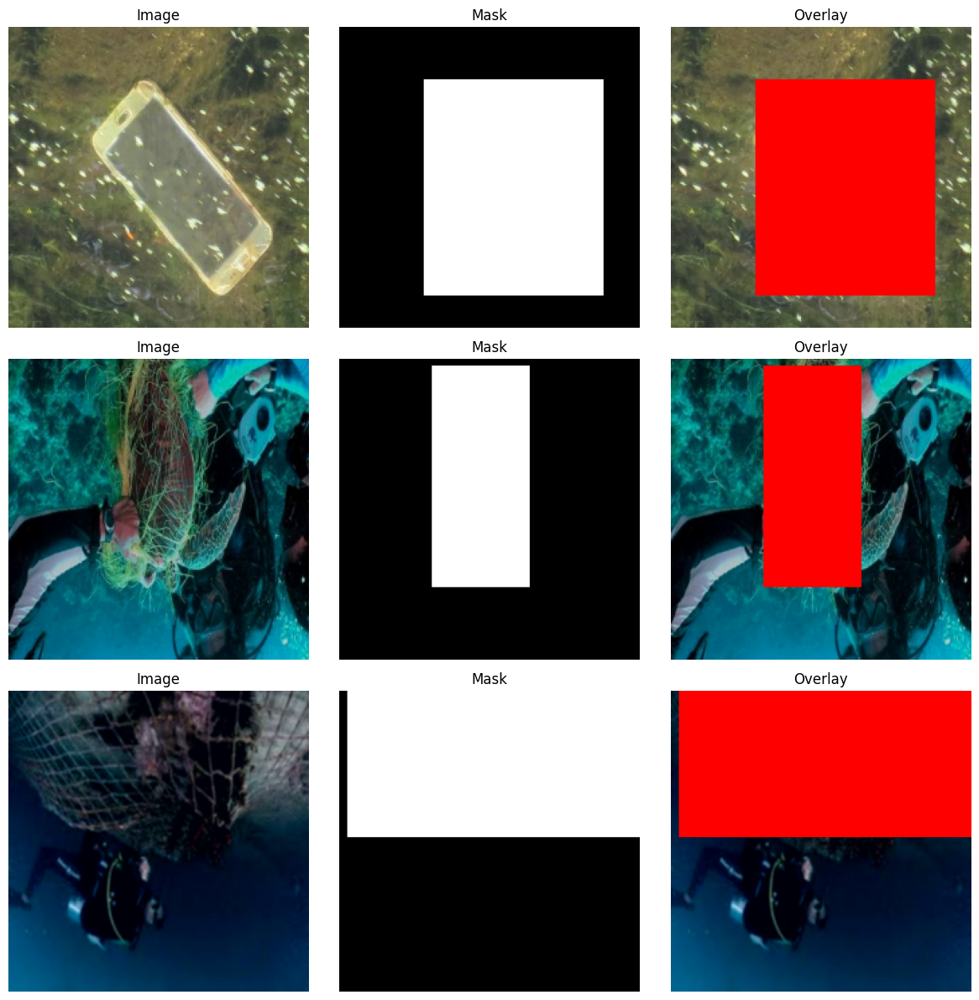


Backbone: resnet50
Train batches: 454


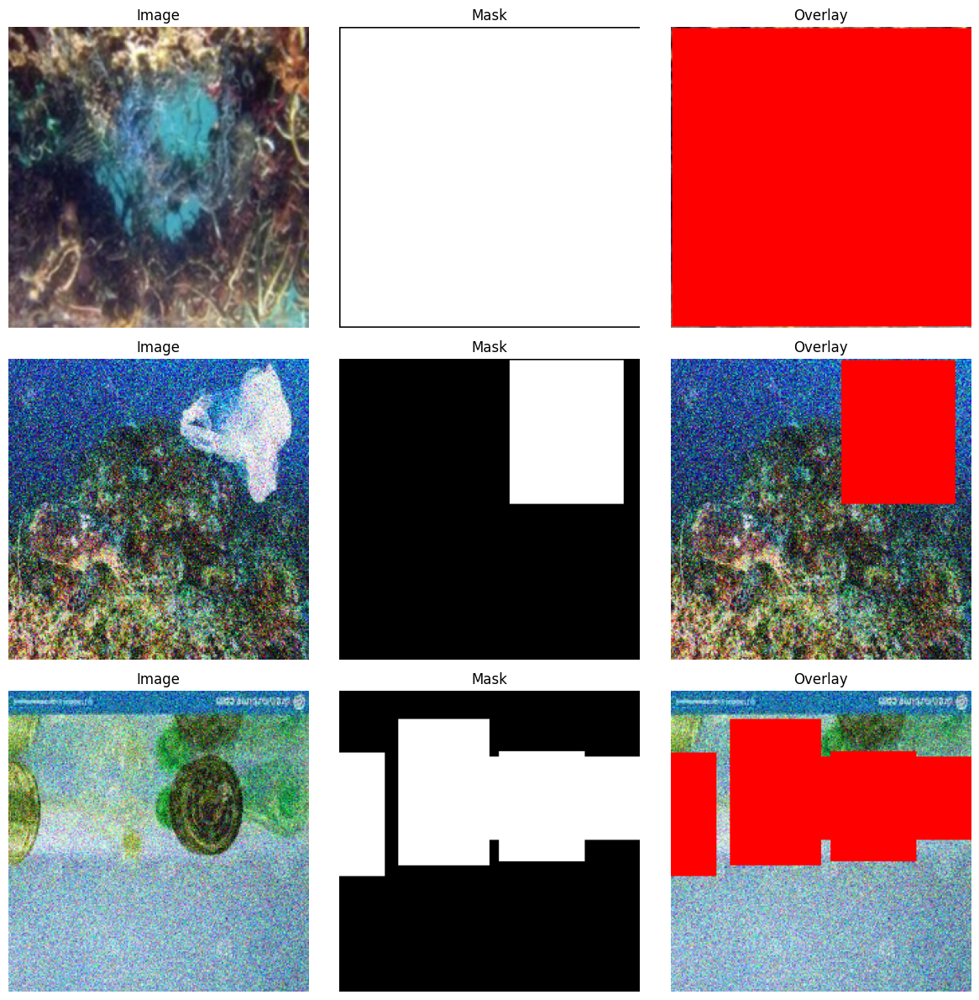


Backbone: convnext
Train batches: 454


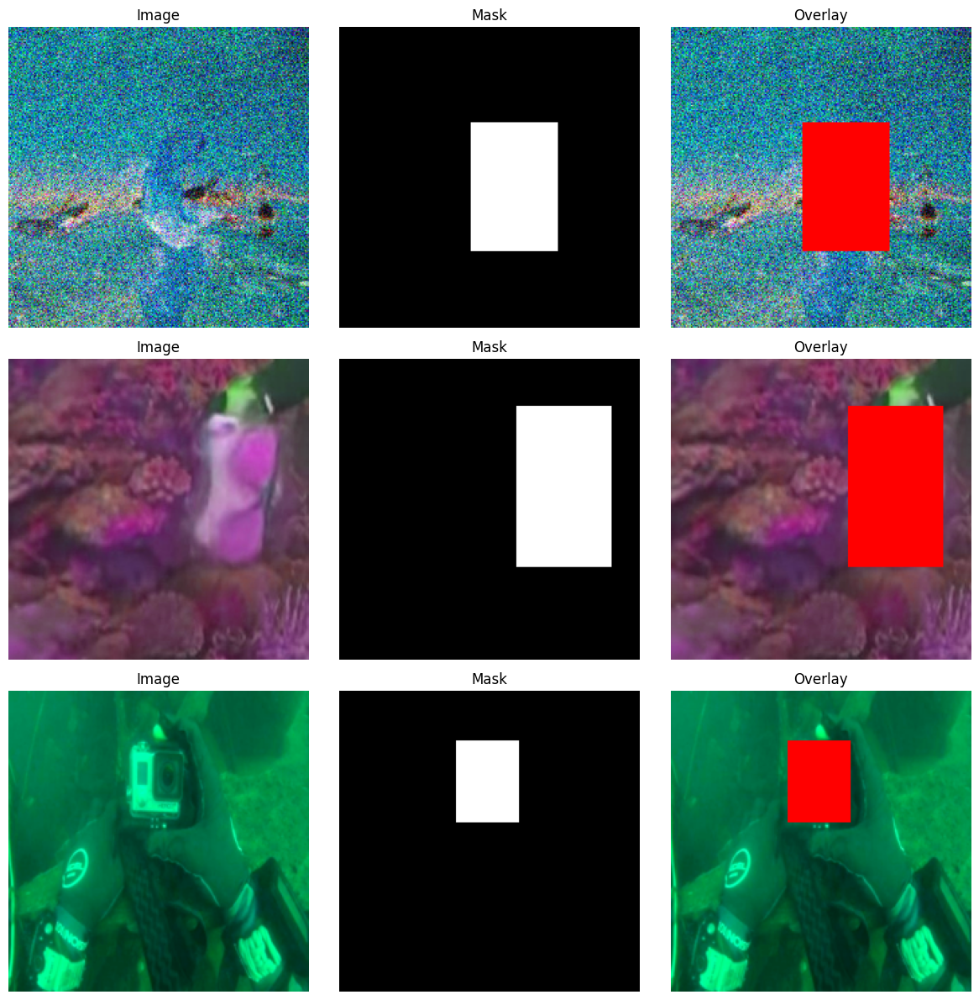

In [ ]:
segmentation_dataset_path = "/content/ocean_waste_segmentation"

for backbone in ['vgg16', 'resnet50', 'convnext']:
    print(f"\nBackbone: {backbone}")
    train_gen, val_gen, test_gen = create_data_generators(segmentation_dataset_path, 8, backbone)
    print(f"Train batches: {len(train_gen)}")
    visualize_batch(train_gen)

## Implementing U-Net with Different Backbones

In [24]:
def create_unet_model(input_shape, backbone='vgg16', num_classes=1):
    """
    Builds a U-Net model with the selected backbone.
    input_shape: shape of the input image (H, W, C)
    backbone: one of 'vgg16', 'resnet50', 'convnext'
    num_classes: 1 for binary, >1 for multiclass segmentation
    """
    inputs = layers.Input(shape=input_shape)
    if backbone == 'vgg16':
        base_model = applications.VGG16(include_top=False, weights='imagenet', input_tensor=inputs)

        # Skip connections from different layers of the encoder
        skip_connections = [
            base_model.get_layer('block1_conv2').output,
            base_model.get_layer('block2_conv2').output,
            base_model.get_layer('block3_conv3').output,
            base_model.get_layer('block4_conv3').output,
        ]
        encoder_output = base_model.get_layer('block5_conv3').output
    elif backbone == 'resnet50':
        base_model = applications.ResNet50(include_top=False, weights='imagenet', input_tensor=inputs)

        skip_connections = [
            base_model.get_layer('conv1_relu').output,
            base_model.get_layer('conv2_block3_out').output,
            base_model.get_layer('conv3_block4_out').output,
            base_model.get_layer('conv4_block6_out').output,
        ]
        encoder_output = base_model.get_layer('conv5_block3_out').output
    elif backbone == 'convnext':
        base_model = applications.ConvNeXtTiny(include_top=False, weights='imagenet', input_tensor=inputs)

        # Adjust skip connection layers for ConvNeXt
        skip_connections = [
            base_model.get_layer('convnext_tiny_stage_0_block_2_layer_scale').output,
            base_model.get_layer('convnext_tiny_stage_1_block_2_layer_scale').output,
            base_model.get_layer('convnext_tiny_stage_2_block_2_layer_scale').output,
            base_model.get_layer('convnext_tiny_stage_3_block_0_layer_scale').output,
        ]

        encoder_output = base_model.get_layer('convnext_tiny_stage_3_block_0_layer_scale').output

    else:
        raise ValueError(f"Unsupported backbone: {backbone}")

    x = encoder_output

    # Set decoder filter sizes depending on encoder type
    if backbone == 'vgg16':
        decoder_filters = [256, 128, 64, 32]
    elif backbone == 'resnet50':
        decoder_filters = [1024, 512, 256, 64]
    elif backbone == 'convnext':
        decoder_filters = [384, 192, 96, 48]

    # Decoder loop: upsample, add skip connections, apply convolutions
    for i in range(4):
        x = layers.Conv2DTranspose(decoder_filters[i], kernel_size=3, strides=2, padding='same')(x)

        # Resize skip connection to match upsampled decoder output if needed
        skip = skip_connections[3 - i]
        # Ensure skip connection shape matches upsampled output shape
        skip = layers.Resizing(x.shape[1], x.shape[2], interpolation='bilinear')(skip) # Resize using bilinear interpolation for better quality

        x = layers.Concatenate()([x, skip])
        x = layers.Conv2D(decoder_filters[i], 3, padding='same', activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Conv2D(decoder_filters[i], 3, padding='same', activation='relu')(x)
        x = layers.BatchNormalization()(x)

    # Optional final upsampling ONLY for resnet50 or others if needed
    if backbone in ['resnet50','convnext']: # Added convnext to the list
        x = layers.Conv2DTranspose(32, kernel_size=3, strides=2, padding='same')(x)

    # Final output layer
    if num_classes == 1:
        outputs = layers.Conv2D(1, 1, padding='same', activation='sigmoid')(x)
    else:
        outputs = layers.Conv2D(num_classes, 1, padding='same', activation='softmax')(x)

    # Create and return the model
    model = models.Model(inputs=inputs, outputs=outputs, name=f'unet_{backbone}')
    return model

In [25]:
# Build U-Net models for all 3 backbones
vgg16_model = create_unet_model((224, 224, 3), 'vgg16', num_classes=1)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [26]:
resnet50_model = create_unet_model((224, 224, 3), 'resnet50', num_classes=1)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [27]:
convnext_model = create_unet_model((224, 224, 3), 'convnext', num_classes=1)

111650432/111650432 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step


In [28]:
print("VGG16 U-Net Model Summary:")
vgg16_model.summary()

print("\nResNet50 U-Net Model Summary:")
resnet50_model.summary()

print("\nConvNeXt U-Net Model Summary:")
convnext_model.summary()


VGG16 U-Net Model Summary:


Model: "unet_vgg16"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 224, 224,  │      1,792 │ input_layer[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 224, 224,  │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, 112, 112,  │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, 112, 112,  │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, 112, 112,  │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 56, 56,    │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, 56, 56,    │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, 56, 56,    │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, 56, 56,    │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, 28, 28,    │          0 │ block3_conv3[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, 28, 28,    │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, 28, 28,    │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, 28, 28,    │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_pool         │ (None, 14, 14,    │          0 │ block4_conv3[0][… │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv1        │ (None, 14, 14,    │  2,359,808 │ block4_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv2        │ (None, 14, 14,    │  2,359,808 │ block5_conv1[0][

 Total params: 19,420,161 (74.08 MB)

 Trainable params: 19,418,241 (74.07 MB)

 Non-trainable params: 1,920 (7.50 KB)


ResNet50 U-Net Model Summary:


Model: "unet_resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 85,816,193 (327.36 MB)

 Trainable params: 85,755,649 (327.13 MB)

 Non-trainable params: 60,544 (236.50 KB)


ConvNeXt U-Net Model Summary:


Model: "unet_convnext"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_pres… │ (None, 224, 224,  │          0 │ input_layer_2[0]… │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stem  │ (None, 56, 56,    │      4,896 │ convnext_tiny_pr… │
│ (Sequential)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │      4,800 │ convnext_tiny_st… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │        192 │ convnext_tiny_st… │
│ (LayerNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │     37,248 │ convnext_tiny_st… │
│ (Dense)             │ 384)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │          0 │ convnext_tiny_st… │
│ (Activation)        │ 384)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │     36,960 │ convnext_tiny_st… │
│ (Dense)             │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │         96 │ convnext_tiny_st… │
│ (LayerScale)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │          0 │ convnext_tiny_st… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 56, 56,    │          0 │ convnext_tiny_st… │
│                     │ 96)               │            │ convnext_tiny_st… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │      4,800 │ add[0][0]         │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │        192 │ convnext_tiny_st… │
│ (LayerNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │     37,248 │ convnext_tiny_st… │
│ (Dense)             │ 384)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │          0 │ convnext_tiny_st… │
│ (Activation)        │ 384)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │     36,960 │ convnext_tiny_st… │
│ (Dense)             │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 56, 56,    │         96 │ convnext_tiny_st

 Total params: 28,889,489 (110.20 MB)

 Trainable params: 28,886,609 (110.19 MB)

 Non-trainable params: 2,880 (11.25 KB)

## Defining Loss Functions and Metrics

In [ ]:
def dice_coefficient(y_true, y_pred, smooth=1e-6):
    """
    #Calculates Dice Coefficient for binary masks.
    #A perfect prediction gives a score of 1, and no overlap gives 0.
    """
    # Flatten the true and predicted masks
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)

    # Calculate intersection between prediction and ground truth
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)

    # Dice formula: (2 * intersection + smooth) / (sum of sizes + smooth)
    return (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)


In [ ]:
def dice_loss(y_true, y_pred):
    """
    Dice Loss = 1 - Dice Coefficient.
    Lower loss means better overlap between prediction and ground truth.
    """
    return 1 - dice_coefficient(y_true, y_pred)


In [ ]:
def bce_dice_loss(y_true, y_pred):
    """
    Combines Binary Cross Entropy loss and Dice loss.
    This gives better learning in cases with class imbalance (like small trash objects).
    """
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=False)(y_true, y_pred)
    dice = dice_loss(y_true, y_pred)
    return bce + dice


In [ ]:
def iou_score(y_true, y_pred, smooth=1e-6):
    """
    #Calculates the IoU (Jaccard Index) between prediction and ground truth.
    #IoU = intersection / union
    """
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)

    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    union = tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) - intersection

    return (intersection + smooth) / (union + smooth)

In [ ]:
vgg16_model.compile(optimizer='adam',
                    loss=bce_dice_loss,
                    metrics=[dice_coefficient, iou_score])

In [ ]:
# Similarly, compile the ResNet50 and ConvNeXt models if needed
resnet50_model.compile(optimizer='adam',
                      loss=bce_dice_loss,
                      metrics=[dice_coefficient, iou_score])


In [ ]:
convnext_model.compile(optimizer='adam',
                      loss=bce_dice_loss,
                      metrics=[dice_coefficient, iou_score])

## Training the model

In [ ]:
def train_model(model, train_generator, valid_generator, backbone_name,
                epochs=30, initial_learning_rate=1e-4):
    """
    Train a U-Net model with the specified backbone.

    Args:
        model: U-Net model
        train_generator: Training data generator
        valid_generator: Validation data generator
        backbone_name: Name of the backbone for saving model
        epochs: Number of training epochs
        initial_learning_rate: Initial learning rate

    Returns:
        Training history
    """
    # Compile model
    model.compile(
        optimizer=optimizers.Adam(learning_rate=initial_learning_rate),
        loss=bce_dice_loss,
        metrics=[dice_coefficient, iou_score, 'binary_accuracy']
    )

    # Learning rate scheduler
    def lr_scheduler(epoch, lr):
        if epoch < 10:
            return lr
        else:
            # Convert the result to a Python float
            return lr * float(tf.math.exp(-0.1))

    # Callbacks
    callbacks_list = [
        callbacks.ModelCheckpoint(
            filepath=f'unet_{backbone_name}_best.h5',
            monitor='val_dice_coefficient',
            save_best_only=True,
            mode='max'
        ),
        callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-7,
            verbose=1
        ),
        callbacks.EarlyStopping(
            monitor='val_dice_coefficient',
            patience=10,
            restore_best_weights=True,
            verbose=1,
            mode='max'
        ),
        callbacks.LearningRateScheduler(lr_scheduler)
    ]

    # Train model
    history = model.fit(
        train_generator,
        epochs=epochs,
        validation_data=valid_generator,
        callbacks=callbacks_list,
        verbose=1
    )

    # Save final model
    model.save(f'unet_{backbone_name}_final.h5')

    return history

In [ ]:
# Train each model
histories = {}

In [ ]:
# VGG16 backbone
train_gen_vgg16, valid_gen_vgg16, test_gen_vgg16 = create_data_generators(
    dataset_path=segmentation_dataset_path,
    batch_size=8,
    backbone='vgg16'
)
histories['vgg16'] = train_model(
    model=vgg16_model,
    train_generator=train_gen_vgg16,
    valid_generator=valid_gen_vgg16,
    backbone_name='vgg16',
    epochs=30
)


Epoch 1/30


<ipython-input-21-ee22b2ca25cc>:32: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.2),


454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - binary_accuracy: 0.6723 - dice_coefficient: 0.4922 - iou_score: 0.3305 - loss: 1.1474

454/454 ━━━━━━━━━━━━━━━━━━━━ 119s 194ms/step - binary_accuracy: 0.6725 - dice_coefficient: 0.4923 - iou_score: 0.3306 - loss: 1.1471 - val_binary_accuracy: 0.8263 - val_dice_coefficient: 0.5932 - val_iou_score: 0.4237 - val_loss: 0.8069 - learning_rate: 1.0000e-04
Epoch 2/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - binary_accuracy: 0.8055 - dice_coefficient: 0.5945 - iou_score: 0.4254 - loss: 0.8676

454/454 ━━━━━━━━━━━━━━━━━━━━ 63s 138ms/step - binary_accuracy: 0.8055 - dice_coefficient: 0.5946 - iou_score: 0.4255 - loss: 0.8675 - val_binary_accuracy: 0.8562 - val_dice_coefficient: 0.6446 - val_iou_score: 0.4790 - val_loss: 0.6964 - learning_rate: 1.0000e-04
Epoch 3/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - binary_accuracy: 0.8264 - dice_coefficient: 0.6321 - iou_score: 0.4648 - loss: 0.7809

454/454 ━━━━━━━━━━━━━━━━━━━━ 63s 138ms/step - binary_accuracy: 0.8264 - dice_coefficient: 0.6321 - iou_score: 0.4648 - loss: 0.7809 - val_binary_accuracy: 0.8489 - val_dice_coefficient: 0.6907 - val_iou_score: 0.5307 - val_loss: 0.6512 - learning_rate: 1.0000e-04
Epoch 4/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - binary_accuracy: 0.8413 - dice_coefficient: 0.6593 - iou_score: 0.4942 - loss: 0.7203

454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 137ms/step - binary_accuracy: 0.8413 - dice_coefficient: 0.6593 - iou_score: 0.4942 - loss: 0.7204 - val_binary_accuracy: 0.8442 - val_dice_coefficient: 0.7140 - val_iou_score: 0.5587 - val_loss: 0.6598 - learning_rate: 1.0000e-04
Epoch 5/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - binary_accuracy: 0.8437 - dice_coefficient: 0.6668 - iou_score: 0.5035 - loss: 0.7064

454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 137ms/step - binary_accuracy: 0.8437 - dice_coefficient: 0.6669 - iou_score: 0.5035 - loss: 0.7064 - val_binary_accuracy: 0.8797 - val_dice_coefficient: 0.7367 - val_iou_score: 0.5868 - val_loss: 0.5588 - learning_rate: 1.0000e-04
Epoch 6/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 136ms/step - binary_accuracy: 0.8550 - dice_coefficient: 0.6905 - iou_score: 0.5300 - loss: 0.6566 - val_binary_accuracy: 0.8667 - val_dice_coefficient: 0.7325 - val_iou_score: 0.5813 - val_loss: 0.5780 - learning_rate: 1.0000e-04
Epoch 7/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - binary_accuracy: 0.8654 - dice_coefficient: 0.7086 - iou_score: 0.5516 - loss: 0.6167

454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 137ms/step - binary_accuracy: 0.8654 - dice_coefficient: 0.7086 - iou_score: 0.5516 - loss: 0.6167 - val_binary_accuracy: 0.8890 - val_dice_coefficient: 0.7517 - val_iou_score: 0.6062 - val_loss: 0.5178 - learning_rate: 1.0000e-04
Epoch 8/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - binary_accuracy: 0.8649 - dice_coefficient: 0.7145 - iou_score: 0.5594 - loss: 0.6118

454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 137ms/step - binary_accuracy: 0.8649 - dice_coefficient: 0.7145 - iou_score: 0.5594 - loss: 0.6118 - val_binary_accuracy: 0.8929 - val_dice_coefficient: 0.7553 - val_iou_score: 0.6106 - val_loss: 0.5179 - learning_rate: 1.0000e-04
Epoch 9/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - binary_accuracy: 0.8719 - dice_coefficient: 0.7229 - iou_score: 0.5691 - loss: 0.5926

454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 137ms/step - binary_accuracy: 0.8719 - dice_coefficient: 0.7229 - iou_score: 0.5691 - loss: 0.5926 - val_binary_accuracy: 0.8780 - val_dice_coefficient: 0.7603 - val_iou_score: 0.6184 - val_loss: 0.5225 - learning_rate: 1.0000e-04
Epoch 10/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 135ms/step - binary_accuracy: 0.8759 - dice_coefficient: 0.7328 - iou_score: 0.5808 - loss: 0.5717 - val_binary_accuracy: 0.8882 - val_dice_coefficient: 0.7475 - val_iou_score: 0.6020 - val_loss: 0.5454 - learning_rate: 1.0000e-04
Epoch 11/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - binary_accuracy: 0.8854 - dice_coefficient: 0.7472 - iou_score: 0.5994 - loss: 0.5395

454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 137ms/step - binary_accuracy: 0.8854 - dice_coefficient: 0.7472 - iou_score: 0.5994 - loss: 0.5395 - val_binary_accuracy: 0.9029 - val_dice_coefficient: 0.7870 - val_iou_score: 0.6524 - val_loss: 0.4602 - learning_rate: 9.0484e-05
Epoch 12/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 136ms/step - binary_accuracy: 0.8891 - dice_coefficient: 0.7575 - iou_score: 0.6129 - loss: 0.5196 - val_binary_accuracy: 0.9046 - val_dice_coefficient: 0.7776 - val_iou_score: 0.6391 - val_loss: 0.4552 - learning_rate: 8.1873e-05
Epoch 13/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - binary_accuracy: 0.8950 - dice_coefficient: 0.7700 - iou_score: 0.6288 - loss: 0.4947

454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 137ms/step - binary_accuracy: 0.8950 - dice_coefficient: 0.7700 - iou_score: 0.6288 - loss: 0.4947 - val_binary_accuracy: 0.9086 - val_dice_coefficient: 0.7891 - val_iou_score: 0.6556 - val_loss: 0.4463 - learning_rate: 7.4082e-05
Epoch 14/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - binary_accuracy: 0.9008 - dice_coefficient: 0.7838 - iou_score: 0.6477 - loss: 0.4675

454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 137ms/step - binary_accuracy: 0.9008 - dice_coefficient: 0.7838 - iou_score: 0.6477 - loss: 0.4675 - val_binary_accuracy: 0.9139 - val_dice_coefficient: 0.7994 - val_iou_score: 0.6694 - val_loss: 0.4187 - learning_rate: 6.7032e-05
Epoch 15/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - binary_accuracy: 0.9013 - dice_coefficient: 0.7856 - iou_score: 0.6502 - loss: 0.4624

454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 137ms/step - binary_accuracy: 0.9013 - dice_coefficient: 0.7856 - iou_score: 0.6503 - loss: 0.4623 - val_binary_accuracy: 0.9170 - val_dice_coefficient: 0.8080 - val_iou_score: 0.6810 - val_loss: 0.4009 - learning_rate: 6.0653e-05
Epoch 16/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - binary_accuracy: 0.9076 - dice_coefficient: 0.7969 - iou_score: 0.6652 - loss: 0.4407

454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 137ms/step - binary_accuracy: 0.9076 - dice_coefficient: 0.7969 - iou_score: 0.6652 - loss: 0.4407 - val_binary_accuracy: 0.9179 - val_dice_coefficient: 0.8127 - val_iou_score: 0.6875 - val_loss: 0.3929 - learning_rate: 5.4881e-05
Epoch 17/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - binary_accuracy: 0.9126 - dice_coefficient: 0.8076 - iou_score: 0.6800 - loss: 0.4190

454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 137ms/step - binary_accuracy: 0.9126 - dice_coefficient: 0.8076 - iou_score: 0.6800 - loss: 0.4190 - val_binary_accuracy: 0.9214 - val_dice_coefficient: 0.8213 - val_iou_score: 0.6994 - val_loss: 0.3760 - learning_rate: 4.9659e-05
Epoch 18/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - binary_accuracy: 0.9163 - dice_coefficient: 0.8144 - iou_score: 0.6897 - loss: 0.4031

454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 137ms/step - binary_accuracy: 0.9163 - dice_coefficient: 0.8145 - iou_score: 0.6897 - loss: 0.4030 - val_binary_accuracy: 0.9230 - val_dice_coefficient: 0.8331 - val_iou_score: 0.7171 - val_loss: 0.3743 - learning_rate: 4.4933e-05
Epoch 19/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - binary_accuracy: 0.9174 - dice_coefficient: 0.8185 - iou_score: 0.6959 - loss: 0.3937

454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 137ms/step - binary_accuracy: 0.9174 - dice_coefficient: 0.8185 - iou_score: 0.6959 - loss: 0.3937 - val_binary_accuracy: 0.9252 - val_dice_coefficient: 0.8413 - val_iou_score: 0.7285 - val_loss: 0.3559 - learning_rate: 4.0657e-05
Epoch 20/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 61s 135ms/step - binary_accuracy: 0.9211 - dice_coefficient: 0.8274 - iou_score: 0.7087 - loss: 0.3771 - val_binary_accuracy: 0.9276 - val_dice_coefficient: 0.8410 - val_iou_score: 0.7279 - val_loss: 0.3460 - learning_rate: 3.6788e-05
Epoch 21/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - binary_accuracy: 0.9253 - dice_coefficient: 0.8336 - iou_score: 0.7174 - loss: 0.3581

454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 137ms/step - binary_accuracy: 0.9253 - dice_coefficient: 0.8336 - iou_score: 0.7174 - loss: 0.3581 - val_binary_accuracy: 0.9264 - val_dice_coefficient: 0.8497 - val_iou_score: 0.7409 - val_loss: 0.3494 - learning_rate: 3.3287e-05
Epoch 22/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - binary_accuracy: 0.9252 - dice_coefficient: 0.8379 - iou_score: 0.7238 - loss: 0.3542

454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 137ms/step - binary_accuracy: 0.9252 - dice_coefficient: 0.8379 - iou_score: 0.7238 - loss: 0.3542 - val_binary_accuracy: 0.9311 - val_dice_coefficient: 0.8584 - val_iou_score: 0.7546 - val_loss: 0.3280 - learning_rate: 3.0119e-05
Epoch 23/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 61s 135ms/step - binary_accuracy: 0.9258 - dice_coefficient: 0.8396 - iou_score: 0.7259 - loss: 0.3538 - val_binary_accuracy: 0.9307 - val_dice_coefficient: 0.8500 - val_iou_score: 0.7415 - val_loss: 0.3300 - learning_rate: 2.7253e-05
Epoch 24/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 61s 135ms/step - binary_accuracy: 0.9261 - dice_coefficient: 0.8366 - iou_score: 0.7222 - loss: 0.3543 - val_binary_accuracy: 0.9307 - val_dice_coefficient: 0.8557 - val_iou_score: 0.7502 - val_loss: 0.3290 - learning_rate: 2.4660e-05
Epoch 25/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 61s 135ms/step - binary_accuracy: 0.9291 - dice_coefficient: 0.8438 - iou_score: 0.7324 - loss: 0.3407 - val_binary_accuracy: 0.9322 - val_dice

454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 137ms/step - binary_accuracy: 0.9302 - dice_coefficient: 0.8472 - iou_score: 0.7372 - loss: 0.3341 - val_binary_accuracy: 0.9338 - val_dice_coefficient: 0.8603 - val_iou_score: 0.7573 - val_loss: 0.3194 - learning_rate: 2.0190e-05
Epoch 27/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 61s 135ms/step - binary_accuracy: 0.9323 - dice_coefficient: 0.8518 - iou_score: 0.7439 - loss: 0.3235 - val_binary_accuracy: 0.9340 - val_dice_coefficient: 0.8570 - val_iou_score: 0.7527 - val_loss: 0.3200 - learning_rate: 1.8268e-05
Epoch 28/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 61s 135ms/step - binary_accuracy: 0.9332 - dice_coefficient: 0.8523 - iou_score: 0.7448 - loss: 0.3206 - val_binary_accuracy: 0.9356 - val_dice_coefficient: 0.8602 - val_iou_score: 0.7568 - val_loss: 0.3124 - learning_rate: 1.6530e-05
Epoch 29/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - binary_accuracy: 0.9354 - dice_coefficient: 0.8568 - iou_score: 0.7515 - loss: 0.3113

454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 137ms/step - binary_accuracy: 0.9354 - dice_coefficient: 0.8568 - iou_score: 0.7515 - loss: 0.3113 - val_binary_accuracy: 0.9354 - val_dice_coefficient: 0.8642 - val_iou_score: 0.7632 - val_loss: 0.3088 - learning_rate: 1.4957e-05
Epoch 30/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - binary_accuracy: 0.9346 - dice_coefficient: 0.8578 - iou_score: 0.7536 - loss: 0.3124

454/454 ━━━━━━━━━━━━━━━━━━━━ 62s 137ms/step - binary_accuracy: 0.9346 - dice_coefficient: 0.8578 - iou_score: 0.7536 - loss: 0.3124 - val_binary_accuracy: 0.9372 - val_dice_coefficient: 0.8677 - val_iou_score: 0.7686 - val_loss: 0.3078 - learning_rate: 1.3534e-05
Restoring model weights from the end of the best epoch: 30.


In [ ]:
vgg16_model.save('unet_vgg.h5')

from google.colab import files
files.download('unet_vgg.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ResNet50 backbone
train_gen_resnet50, valid_gen_resnet50, test_gen_resnet50 = create_data_generators(
    dataset_path=segmentation_dataset_path,
    batch_size=8,
    backbone='resnet50'
)

histories['resnet50'] = train_model(
    model=resnet50_model,
    train_generator=train_gen_resnet50,
    valid_generator=valid_gen_resnet50,
    backbone_name='resnet50',
    epochs=30
)

Epoch 1/30


<ipython-input-21-ee22b2ca25cc>:32: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.2),


454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - binary_accuracy: 0.7666 - dice_coefficient: 0.5672 - iou_score: 0.4014 - loss: 0.9430

454/454 ━━━━━━━━━━━━━━━━━━━━ 176s 232ms/step - binary_accuracy: 0.7667 - dice_coefficient: 0.5673 - iou_score: 0.4015 - loss: 0.9428 - val_binary_accuracy: 0.7105 - val_dice_coefficient: 0.5264 - val_iou_score: 0.3595 - val_loss: 1.1596 - learning_rate: 1.0000e-04
Epoch 2/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - binary_accuracy: 0.8517 - dice_coefficient: 0.6866 - iou_score: 0.5252 - loss: 0.6764

454/454 ━━━━━━━━━━━━━━━━━━━━ 74s 162ms/step - binary_accuracy: 0.8517 - dice_coefficient: 0.6866 - iou_score: 0.5252 - loss: 0.6764 - val_binary_accuracy: 0.8715 - val_dice_coefficient: 0.7389 - val_iou_score: 0.5910 - val_loss: 0.7292 - learning_rate: 1.0000e-04
Epoch 3/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - binary_accuracy: 0.8604 - dice_coefficient: 0.7042 - iou_score: 0.5460 - loss: 0.6343

454/454 ━━━━━━━━━━━━━━━━━━━━ 77s 169ms/step - binary_accuracy: 0.8604 - dice_coefficient: 0.7042 - iou_score: 0.5460 - loss: 0.6343 - val_binary_accuracy: 0.8661 - val_dice_coefficient: 0.7703 - val_iou_score: 0.6297 - val_loss: 0.7044 - learning_rate: 1.0000e-04
Epoch 4/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - binary_accuracy: 0.8718 - dice_coefficient: 0.7266 - iou_score: 0.5731 - loss: 0.5853

454/454 ━━━━━━━━━━━━━━━━━━━━ 77s 169ms/step - binary_accuracy: 0.8718 - dice_coefficient: 0.7266 - iou_score: 0.5731 - loss: 0.5852 - val_binary_accuracy: 0.9001 - val_dice_coefficient: 0.7955 - val_iou_score: 0.6628 - val_loss: 0.4788 - learning_rate: 1.0000e-04
Epoch 5/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 68s 149ms/step - binary_accuracy: 0.8754 - dice_coefficient: 0.7380 - iou_score: 0.5873 - loss: 0.5689 - val_binary_accuracy: 0.8704 - val_dice_coefficient: 0.7743 - val_iou_score: 0.6361 - val_loss: 0.5893 - learning_rate: 1.0000e-04
Epoch 6/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 68s 149ms/step - binary_accuracy: 0.8840 - dice_coefficient: 0.7546 - iou_score: 0.6084 - loss: 0.5323 - val_binary_accuracy: 0.8778 - val_dice_coefficient: 0.7798 - val_iou_score: 0.6431 - val_loss: 0.5265 - learning_rate: 1.0000e-04
Epoch 7/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - binary_accuracy: 0.8891 - dice_coefficient: 0.7630 - iou_score: 0.6194 - loss: 0.5110

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 168ms/step - binary_accuracy: 0.8891 - dice_coefficient: 0.7629 - iou_score: 0.6194 - loss: 0.5110 - val_binary_accuracy: 0.8906 - val_dice_coefficient: 0.7964 - val_iou_score: 0.6650 - val_loss: 0.4977 - learning_rate: 1.0000e-04
Epoch 8/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - binary_accuracy: 0.8945 - dice_coefficient: 0.7723 - iou_score: 0.6323 - loss: 0.4919

454/454 ━━━━━━━━━━━━━━━━━━━━ 75s 165ms/step - binary_accuracy: 0.8945 - dice_coefficient: 0.7723 - iou_score: 0.6323 - loss: 0.4919 - val_binary_accuracy: 0.9135 - val_dice_coefficient: 0.8183 - val_iou_score: 0.6956 - val_loss: 0.4050 - learning_rate: 1.0000e-04
Epoch 9/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 68s 148ms/step - binary_accuracy: 0.9010 - dice_coefficient: 0.7867 - iou_score: 0.6512 - loss: 0.4648 - val_binary_accuracy: 0.9056 - val_dice_coefficient: 0.8108 - val_iou_score: 0.6853 - val_loss: 0.4470 - learning_rate: 1.0000e-04
Epoch 10/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 67s 148ms/step - binary_accuracy: 0.9035 - dice_coefficient: 0.7882 - iou_score: 0.6533 - loss: 0.4557 - val_binary_accuracy: 0.9087 - val_dice_coefficient: 0.8176 - val_iou_score: 0.6956 - val_loss: 0.4556 - learning_rate: 1.0000e-04
Epoch 11/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - binary_accuracy: 0.9028 - dice_coefficient: 0.7897 - iou_score: 0.6551 - loss: 0.4567

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 167ms/step - binary_accuracy: 0.9028 - dice_coefficient: 0.7897 - iou_score: 0.6551 - loss: 0.4566 - val_binary_accuracy: 0.9141 - val_dice_coefficient: 0.8274 - val_iou_score: 0.7089 - val_loss: 0.4079 - learning_rate: 9.0484e-05
Epoch 12/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - binary_accuracy: 0.9106 - dice_coefficient: 0.8045 - iou_score: 0.6758 - loss: 0.4242

454/454 ━━━━━━━━━━━━━━━━━━━━ 74s 164ms/step - binary_accuracy: 0.9106 - dice_coefficient: 0.8045 - iou_score: 0.6758 - loss: 0.4242 - val_binary_accuracy: 0.9175 - val_dice_coefficient: 0.8314 - val_iou_score: 0.7140 - val_loss: 0.3891 - learning_rate: 8.1873e-05
Epoch 13/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - binary_accuracy: 0.9145 - dice_coefficient: 0.8151 - iou_score: 0.6903 - loss: 0.4040

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 167ms/step - binary_accuracy: 0.9145 - dice_coefficient: 0.8151 - iou_score: 0.6903 - loss: 0.4040 - val_binary_accuracy: 0.9236 - val_dice_coefficient: 0.8365 - val_iou_score: 0.7220 - val_loss: 0.3686 - learning_rate: 7.4082e-05
Epoch 14/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - binary_accuracy: 0.9173 - dice_coefficient: 0.8231 - iou_score: 0.7020 - loss: 0.3905

454/454 ━━━━━━━━━━━━━━━━━━━━ 75s 165ms/step - binary_accuracy: 0.9174 - dice_coefficient: 0.8231 - iou_score: 0.7020 - loss: 0.3905 - val_binary_accuracy: 0.9281 - val_dice_coefficient: 0.8515 - val_iou_score: 0.7436 - val_loss: 0.3480 - learning_rate: 6.7032e-05
Epoch 15/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 67s 148ms/step - binary_accuracy: 0.9224 - dice_coefficient: 0.8310 - iou_score: 0.7134 - loss: 0.3690 - val_binary_accuracy: 0.9272 - val_dice_coefficient: 0.8502 - val_iou_score: 0.7419 - val_loss: 0.3485 - learning_rate: 6.0653e-05
Epoch 16/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - binary_accuracy: 0.9244 - dice_coefficient: 0.8342 - iou_score: 0.7182 - loss: 0.3600

454/454 ━━━━━━━━━━━━━━━━━━━━ 75s 166ms/step - binary_accuracy: 0.9244 - dice_coefficient: 0.8342 - iou_score: 0.7182 - loss: 0.3600 - val_binary_accuracy: 0.9327 - val_dice_coefficient: 0.8585 - val_iou_score: 0.7547 - val_loss: 0.3292 - learning_rate: 5.4881e-05
Epoch 17/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 67s 148ms/step - binary_accuracy: 0.9291 - dice_coefficient: 0.8450 - iou_score: 0.7336 - loss: 0.3358 - val_binary_accuracy: 0.9317 - val_dice_coefficient: 0.8456 - val_iou_score: 0.7351 - val_loss: 0.3436 - learning_rate: 4.9659e-05
Epoch 18/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - binary_accuracy: 0.9311 - dice_coefficient: 0.8445 - iou_score: 0.7331 - loss: 0.3332

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 167ms/step - binary_accuracy: 0.9311 - dice_coefficient: 0.8445 - iou_score: 0.7331 - loss: 0.3332 - val_binary_accuracy: 0.9356 - val_dice_coefficient: 0.8615 - val_iou_score: 0.7590 - val_loss: 0.3078 - learning_rate: 4.4933e-05
Epoch 19/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - binary_accuracy: 0.9329 - dice_coefficient: 0.8547 - iou_score: 0.7483 - loss: 0.3184

454/454 ━━━━━━━━━━━━━━━━━━━━ 75s 164ms/step - binary_accuracy: 0.9329 - dice_coefficient: 0.8547 - iou_score: 0.7483 - loss: 0.3184 - val_binary_accuracy: 0.9365 - val_dice_coefficient: 0.8663 - val_iou_score: 0.7663 - val_loss: 0.3101 - learning_rate: 4.0657e-05
Epoch 20/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 68s 149ms/step - binary_accuracy: 0.9317 - dice_coefficient: 0.8547 - iou_score: 0.7485 - loss: 0.3190 - val_binary_accuracy: 0.9367 - val_dice_coefficient: 0.8652 - val_iou_score: 0.7652 - val_loss: 0.3082 - learning_rate: 3.6788e-05
Epoch 21/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - binary_accuracy: 0.9357 - dice_coefficient: 0.8643 - iou_score: 0.7634 - loss: 0.2994

454/454 ━━━━━━━━━━━━━━━━━━━━ 77s 169ms/step - binary_accuracy: 0.9357 - dice_coefficient: 0.8643 - iou_score: 0.7634 - loss: 0.2995 - val_binary_accuracy: 0.9383 - val_dice_coefficient: 0.8725 - val_iou_score: 0.7761 - val_loss: 0.3026 - learning_rate: 3.3287e-05
Epoch 22/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - binary_accuracy: 0.9383 - dice_coefficient: 0.8651 - iou_score: 0.7645 - loss: 0.2950

454/454 ━━━━━━━━━━━━━━━━━━━━ 78s 171ms/step - binary_accuracy: 0.9383 - dice_coefficient: 0.8651 - iou_score: 0.7645 - loss: 0.2950 - val_binary_accuracy: 0.9387 - val_dice_coefficient: 0.8782 - val_iou_score: 0.7851 - val_loss: 0.3000 - learning_rate: 3.0119e-05
Epoch 23/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 68s 149ms/step - binary_accuracy: 0.9411 - dice_coefficient: 0.8722 - iou_score: 0.7752 - loss: 0.2802 - val_binary_accuracy: 0.9388 - val_dice_coefficient: 0.8763 - val_iou_score: 0.7824 - val_loss: 0.2977 - learning_rate: 2.7253e-05
Epoch 24/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 67s 148ms/step - binary_accuracy: 0.9426 - dice_coefficient: 0.8763 - iou_score: 0.7817 - loss: 0.2717 - val_binary_accuracy: 0.9403 - val_dice_coefficient: 0.8740 - val_iou_score: 0.7786 - val_loss: 0.2891 - learning_rate: 2.4660e-05
Epoch 25/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - binary_accuracy: 0.9428 - dice_coefficient: 0.8743 - iou_score: 0.7786 - loss: 0.2735

454/454 ━━━━━━━━━━━━━━━━━━━━ 77s 169ms/step - binary_accuracy: 0.9428 - dice_coefficient: 0.8743 - iou_score: 0.7786 - loss: 0.2735 - val_binary_accuracy: 0.9405 - val_dice_coefficient: 0.8790 - val_iou_score: 0.7867 - val_loss: 0.2912 - learning_rate: 2.2313e-05
Epoch 26/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - binary_accuracy: 0.9425 - dice_coefficient: 0.8738 - iou_score: 0.7776 - loss: 0.2721

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 168ms/step - binary_accuracy: 0.9425 - dice_coefficient: 0.8738 - iou_score: 0.7776 - loss: 0.2721 - val_binary_accuracy: 0.9412 - val_dice_coefficient: 0.8810 - val_iou_score: 0.7896 - val_loss: 0.2915 - learning_rate: 2.0190e-05
Epoch 27/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - binary_accuracy: 0.9435 - dice_coefficient: 0.8775 - iou_score: 0.7838 - loss: 0.2696

454/454 ━━━━━━━━━━━━━━━━━━━━ 77s 169ms/step - binary_accuracy: 0.9435 - dice_coefficient: 0.8775 - iou_score: 0.7838 - loss: 0.2696 - val_binary_accuracy: 0.9418 - val_dice_coefficient: 0.8840 - val_iou_score: 0.7942 - val_loss: 0.2876 - learning_rate: 1.8268e-05
Epoch 28/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 68s 149ms/step - binary_accuracy: 0.9430 - dice_coefficient: 0.8766 - iou_score: 0.7821 - loss: 0.2706 - val_binary_accuracy: 0.9422 - val_dice_coefficient: 0.8799 - val_iou_score: 0.7880 - val_loss: 0.2865 - learning_rate: 1.6530e-05
Epoch 29/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - binary_accuracy: 0.9455 - dice_coefficient: 0.8832 - iou_score: 0.7924 - loss: 0.2566

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 168ms/step - binary_accuracy: 0.9455 - dice_coefficient: 0.8832 - iou_score: 0.7924 - loss: 0.2566 - val_binary_accuracy: 0.9423 - val_dice_coefficient: 0.8841 - val_iou_score: 0.7943 - val_loss: 0.2848 - learning_rate: 1.4957e-05
Epoch 30/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 67s 148ms/step - binary_accuracy: 0.9492 - dice_coefficient: 0.8885 - iou_score: 0.8009 - loss: 0.2421 - val_binary_accuracy: 0.9422 - val_dice_coefficient: 0.8815 - val_iou_score: 0.7902 - val_loss: 0.2881 - learning_rate: 1.3534e-05
Restoring model weights from the end of the best epoch: 29.


In [ ]:
resnet50_model.save('unet_resnet.h5')

from google.colab import files
files.download('unet_resnet.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ConvNeXt backbone
train_gen_convnext, valid_gen_convnext, test_gen_convnext = create_data_generators(
    dataset_path=segmentation_dataset_path,
    batch_size=8,
    backbone='convnext'
)
histories['convnext'] = train_model(
    model=convnext_model,
    train_generator=train_gen_convnext,
    valid_generator=valid_gen_convnext,
    backbone_name='convnext',
    epochs=30
)

Epoch 1/30


<ipython-input-21-ee22b2ca25cc>:32: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.2),


454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step - binary_accuracy: 0.9438 - dice_coefficient: 0.8795 - iou_score: 0.7866 - loss: 0.2658

454/454 ━━━━━━━━━━━━━━━━━━━━ 164s 231ms/step - binary_accuracy: 0.9438 - dice_coefficient: 0.8794 - iou_score: 0.7866 - loss: 0.2658 - val_binary_accuracy: 0.9404 - val_dice_coefficient: 0.8786 - val_iou_score: 0.7862 - val_loss: 0.2975 - learning_rate: 1.0000e-04
Epoch 2/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - binary_accuracy: 0.9450 - dice_coefficient: 0.8809 - iou_score: 0.7889 - loss: 0.2606

454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 142ms/step - binary_accuracy: 0.9450 - dice_coefficient: 0.8809 - iou_score: 0.7889 - loss: 0.2606 - val_binary_accuracy: 0.9412 - val_dice_coefficient: 0.8829 - val_iou_score: 0.7924 - val_loss: 0.2947 - learning_rate: 1.0000e-04
Epoch 3/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 63s 139ms/step - binary_accuracy: 0.9424 - dice_coefficient: 0.8773 - iou_score: 0.7833 - loss: 0.2704 - val_binary_accuracy: 0.9419 - val_dice_coefficient: 0.8816 - val_iou_score: 0.7898 - val_loss: 0.2890 - learning_rate: 1.0000e-04
Epoch 4/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 63s 139ms/step - binary_accuracy: 0.9469 - dice_coefficient: 0.8856 - iou_score: 0.7965 - loss: 0.2508 - val_binary_accuracy: 0.9409 - val_dice_coefficient: 0.8800 - val_iou_score: 0.7879 - val_loss: 0.2999 - learning_rate: 1.0000e-04
Epoch 5/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - binary_accuracy: 0.9452 - dice_coefficient: 0.8810 - iou_score: 0.7889 - loss: 0.2604

454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 141ms/step - binary_accuracy: 0.9452 - dice_coefficient: 0.8810 - iou_score: 0.7889 - loss: 0.2604 - val_binary_accuracy: 0.9411 - val_dice_coefficient: 0.8853 - val_iou_score: 0.7964 - val_loss: 0.2981 - learning_rate: 1.0000e-04
Epoch 6/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - binary_accuracy: 0.9434 - dice_coefficient: 0.8788 - iou_score: 0.7857 - loss: 0.2658

454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 141ms/step - binary_accuracy: 0.9434 - dice_coefficient: 0.8788 - iou_score: 0.7857 - loss: 0.2658 - val_binary_accuracy: 0.9429 - val_dice_coefficient: 0.8853 - val_iou_score: 0.7960 - val_loss: 0.2815 - learning_rate: 1.0000e-04
Epoch 7/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - binary_accuracy: 0.9481 - dice_coefficient: 0.8878 - iou_score: 0.7998 - loss: 0.2449

454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 141ms/step - binary_accuracy: 0.9481 - dice_coefficient: 0.8878 - iou_score: 0.7998 - loss: 0.2450 - val_binary_accuracy: 0.9421 - val_dice_coefficient: 0.8857 - val_iou_score: 0.7969 - val_loss: 0.2893 - learning_rate: 1.0000e-04
Epoch 8/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 63s 139ms/step - binary_accuracy: 0.9490 - dice_coefficient: 0.8909 - iou_score: 0.8047 - loss: 0.2403 - val_binary_accuracy: 0.9429 - val_dice_coefficient: 0.8839 - val_iou_score: 0.7941 - val_loss: 0.2824 - learning_rate: 1.0000e-04
Epoch 9/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 63s 139ms/step - binary_accuracy: 0.9512 - dice_coefficient: 0.8947 - iou_score: 0.8110 - loss: 0.2301 - val_binary_accuracy: 0.9422 - val_dice_coefficient: 0.8786 - val_iou_score: 0.7861 - val_loss: 0.2866 - learning_rate: 1.0000e-04
Epoch 10/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 63s 139ms/step - binary_accuracy: 0.9487 - dice_coefficient: 0.8882 - iou_score: 0.8005 - loss: 0.2436 - val_binary_accuracy: 0.9428 - val_dice_c

454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 142ms/step - binary_accuracy: 0.9510 - dice_coefficient: 0.8942 - iou_score: 0.8099 - loss: 0.2310 - val_binary_accuracy: 0.9440 - val_dice_coefficient: 0.8869 - val_iou_score: 0.7987 - val_loss: 0.2903 - learning_rate: 9.0484e-05
Epoch 12/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 63s 139ms/step - binary_accuracy: 0.9525 - dice_coefficient: 0.8974 - iou_score: 0.8153 - loss: 0.2233 - val_binary_accuracy: 0.9429 - val_dice_coefficient: 0.8858 - val_iou_score: 0.7970 - val_loss: 0.2896 - learning_rate: 8.1873e-05
Epoch 13/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 63s 139ms/step - binary_accuracy: 0.9518 - dice_coefficient: 0.8969 - iou_score: 0.8146 - loss: 0.2266 - val_binary_accuracy: 0.9449 - val_dice_coefficient: 0.8868 - val_iou_score: 0.7986 - val_loss: 0.2748 - learning_rate: 7.4082e-05
Epoch 14/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - binary_accuracy: 0.9535 - dice_coefficient: 0.8999 - iou_score: 0.8194 - loss: 0.2189

454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 141ms/step - binary_accuracy: 0.9535 - dice_coefficient: 0.8999 - iou_score: 0.8194 - loss: 0.2189 - val_binary_accuracy: 0.9462 - val_dice_coefficient: 0.8909 - val_iou_score: 0.8048 - val_loss: 0.2691 - learning_rate: 6.7032e-05
Epoch 15/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - binary_accuracy: 0.9532 - dice_coefficient: 0.8996 - iou_score: 0.8192 - loss: 0.2191

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 142ms/step - binary_accuracy: 0.9532 - dice_coefficient: 0.8996 - iou_score: 0.8192 - loss: 0.2191 - val_binary_accuracy: 0.9453 - val_dice_coefficient: 0.8915 - val_iou_score: 0.8059 - val_loss: 0.2752 - learning_rate: 6.0653e-05
Epoch 16/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - binary_accuracy: 0.9558 - dice_coefficient: 0.9057 - iou_score: 0.8290 - loss: 0.2067

454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 142ms/step - binary_accuracy: 0.9558 - dice_coefficient: 0.9057 - iou_score: 0.8290 - loss: 0.2067 - val_binary_accuracy: 0.9461 - val_dice_coefficient: 0.8928 - val_iou_score: 0.8082 - val_loss: 0.2792 - learning_rate: 5.4881e-05
Epoch 17/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - binary_accuracy: 0.9559 - dice_coefficient: 0.9059 - iou_score: 0.8293 - loss: 0.2052

454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 142ms/step - binary_accuracy: 0.9559 - dice_coefficient: 0.9059 - iou_score: 0.8293 - loss: 0.2052 - val_binary_accuracy: 0.9465 - val_dice_coefficient: 0.8928 - val_iou_score: 0.8082 - val_loss: 0.2719 - learning_rate: 4.9659e-05
Epoch 18/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 63s 139ms/step - binary_accuracy: 0.9585 - dice_coefficient: 0.9088 - iou_score: 0.8342 - loss: 0.1968 - val_binary_accuracy: 0.9469 - val_dice_coefficient: 0.8919 - val_iou_score: 0.8070 - val_loss: 0.2677 - learning_rate: 4.4933e-05
Epoch 19/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - binary_accuracy: 0.9585 - dice_coefficient: 0.9109 - iou_score: 0.8378 - loss: 0.1949

454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 141ms/step - binary_accuracy: 0.9585 - dice_coefficient: 0.9109 - iou_score: 0.8378 - loss: 0.1949 - val_binary_accuracy: 0.9474 - val_dice_coefficient: 0.8956 - val_iou_score: 0.8125 - val_loss: 0.2683 - learning_rate: 4.0657e-05
Epoch 20/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - binary_accuracy: 0.9583 - dice_coefficient: 0.9099 - iou_score: 0.8359 - loss: 0.1962

454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 141ms/step - binary_accuracy: 0.9583 - dice_coefficient: 0.9099 - iou_score: 0.8359 - loss: 0.1962 - val_binary_accuracy: 0.9476 - val_dice_coefficient: 0.8973 - val_iou_score: 0.8154 - val_loss: 0.2691 - learning_rate: 3.6788e-05
Epoch 21/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - binary_accuracy: 0.9594 - dice_coefficient: 0.9109 - iou_score: 0.8378 - loss: 0.1920

454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 141ms/step - binary_accuracy: 0.9594 - dice_coefficient: 0.9109 - iou_score: 0.8378 - loss: 0.1920 - val_binary_accuracy: 0.9477 - val_dice_coefficient: 0.8993 - val_iou_score: 0.8190 - val_loss: 0.2654 - learning_rate: 3.3287e-05
Epoch 22/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 63s 138ms/step - binary_accuracy: 0.9609 - dice_coefficient: 0.9153 - iou_score: 0.8451 - loss: 0.1825 - val_binary_accuracy: 0.9478 - val_dice_coefficient: 0.8933 - val_iou_score: 0.8091 - val_loss: 0.2665 - learning_rate: 3.0119e-05
Epoch 23/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 63s 139ms/step - binary_accuracy: 0.9613 - dice_coefficient: 0.9159 - iou_score: 0.8460 - loss: 0.1813 - val_binary_accuracy: 0.9470 - val_dice_coefficient: 0.8966 - val_iou_score: 0.8144 - val_loss: 0.2771 - learning_rate: 2.7253e-05
Epoch 24/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 63s 138ms/step - binary_accuracy: 0.9616 - dice_coefficient: 0.9186 - iou_score: 0.8504 - loss: 0.1778 - val_binary_accuracy: 0.9473 - val_dice

454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 141ms/step - binary_accuracy: 0.9640 - dice_coefficient: 0.9232 - iou_score: 0.8583 - loss: 0.1666 - val_binary_accuracy: 0.9487 - val_dice_coefficient: 0.9009 - val_iou_score: 0.8214 - val_loss: 0.2680 - learning_rate: 6.7668e-06
Restoring model weights from the end of the best epoch: 30.


In [ ]:
convnext_model.save('unet_convnext.h5')

from google.colab import files
files.download('unet_convnext.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Evaluation of Model

In [ ]:
def evaluate_model(model, test_generator, backbone_name):
    """
    Evaluate a trained model on the test set.

    Args:
        model: Trained U-Net model
        test_generator: Test data generator
        backbone_name: Name of the backbone for reporting

    Returns:
        Evaluation metrics
    """

    # Evaluate model
    results = model.evaluate(test_generator, verbose=1)
    metrics_dict = {
        'loss': results[0],
        'binary_accuracy': results[1],
        'dice_coefficient': results[2],
        'iou_score': results[3]
    }
    # Print results
    print(f"\nEvaluation results for U-Net with {backbone_name} backbone:")
    for metric_name, value in zip(model.metrics_names, results):
        print(f"{metric_name}: {value:.4f}")

    #return {metric_name: value for metric_name, value in zip(model.metrics_names, results)}
    return metrics_dict

# Evaluate each model
evaluation_results = {}

# VGG16 backbone
evaluation_results['vgg16'] = evaluate_model(
    model=vgg16_model,
    test_generator=test_gen_vgg16,
    backbone_name='vgg16'
)

# ResNet50 backbone
evaluation_results['resnet50'] = evaluate_model(
    model=resnet50_model,
    test_generator=test_gen_resnet50,
    backbone_name='resnet50'
)

# ConvNeXt backbone
evaluation_results['convnext'] = evaluate_model(
    model=convnext_model,
    test_generator=test_gen_convnext,
    backbone_name='convnext'
)


63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - binary_accuracy: 0.9276 - dice_coefficient: 0.8450 - iou_score: 0.7343 - loss: 0.3560

Evaluation results for U-Net with vgg16 backbone:
loss: 0.3359
compile_metrics: 0.9326
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - binary_accuracy: 0.9413 - dice_coefficient: 0.8695 - iou_score: 0.7720 - loss: 0.2986

Evaluation results for U-Net with resnet50 backbone:
loss: 0.2957
compile_metrics: 0.9409
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - binary_accuracy: 0.9420 - dice_coefficient: 0.8828 - iou_score: 0.7925 - loss: 0.3093

Evaluation results for U-Net with convnext backbone:
loss: 0.3130
compile_metrics: 0.9427


In [ ]:
evaluation_results

{'vgg16': {'loss': 0.33585456013679504,
  'binary_accuracy': 0.93264240026474,
  'dice_coefficient': 0.8518158197402954,
  'iou_score': 0.7449049353599548},
 'resnet50': {'loss': 0.29565107822418213,
  'binary_accuracy': 0.9409198760986328,
  'dice_coefficient': 0.8703722953796387,
  'iou_score': 0.7733595967292786},
 'convnext': {'loss': 0.31301888823509216,
  'binary_accuracy': 0.9426990151405334,
  'dice_coefficient': 0.8794353604316711,
  'iou_score': 0.7876735925674438}}

## Visualizing Results

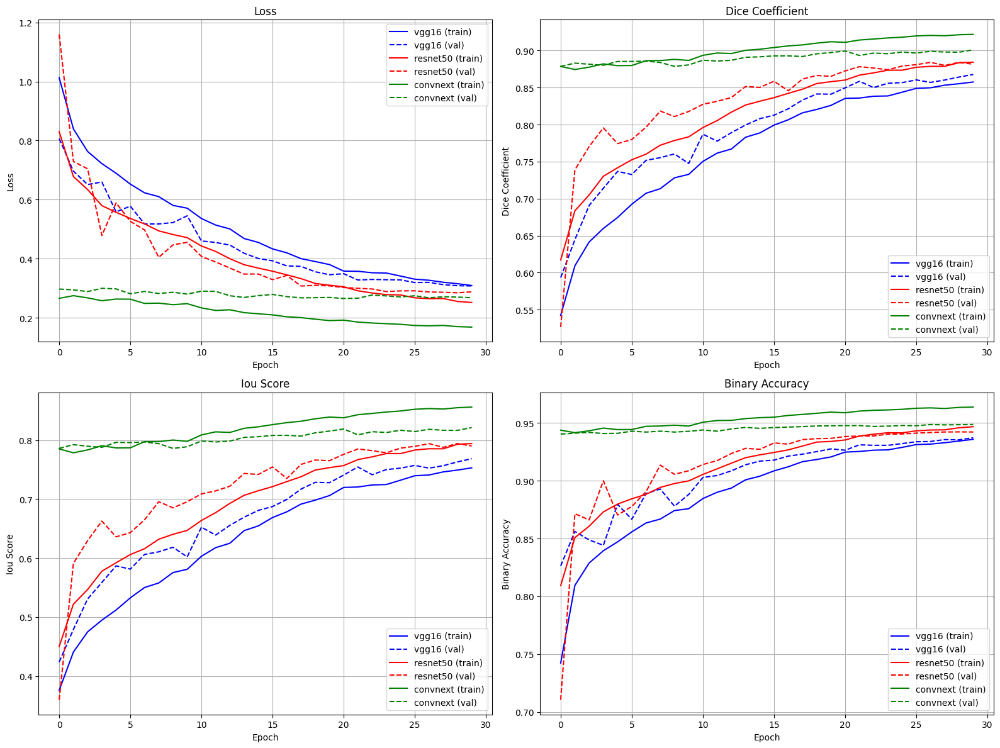

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


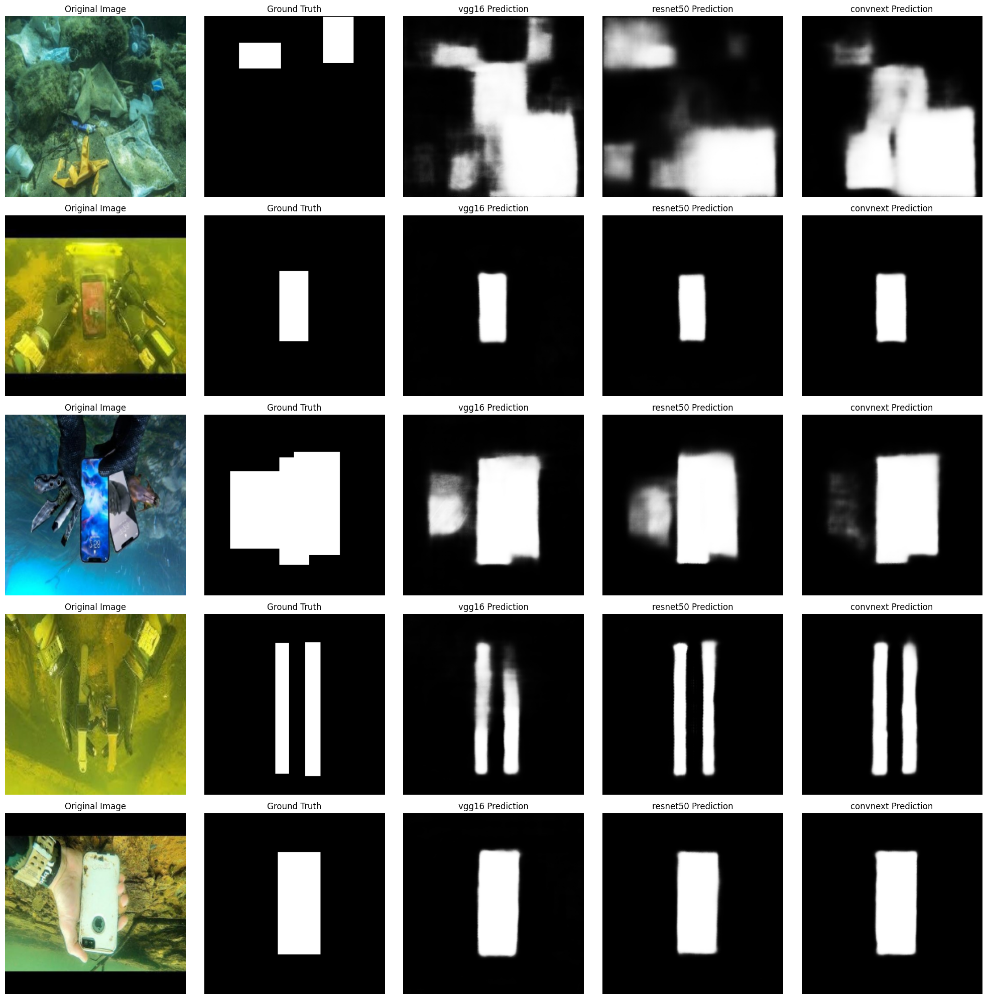

In [ ]:
def plot_training_history(histories):
    """
    Plot training history for multiple models.

    Args:
        histories: Dictionary of training histories for each backbone
    """
    metrics = ['loss', 'dice_coefficient', 'iou_score', 'binary_accuracy']
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()

    colors = {
        'vgg16': 'blue',
        'resnet50': 'red',
        'convnext': 'green'
    }

    for i, metric in enumerate(metrics):
        for backbone, history in histories.items():
            axes[i].plot(
                history.history[metric],
                label=f'{backbone} (train)',
                color=colors[backbone],
                linestyle='-'
            )
            axes[i].plot(
                history.history[f'val_{metric}'],
                label=f'{backbone} (val)',
                color=colors[backbone],
                linestyle='--'
            )

        axes[i].set_title(f'{metric.replace("_", " ").title()}')
        axes[i].set_xlabel('Epoch')
        axes[i].set_ylabel(metric.replace("_", " ").title())
        axes[i].legend()
        axes[i].grid(True)

    plt.tight_layout()
    plt.savefig('training_history.png', dpi=300, bbox_inches='tight')
    plt.show()

def visualize_predictions(models, test_generators, num_samples=3):
    """
    Visualize predictions from multiple models.

    Args:
        models: Dictionary of trained models for each backbone
        test_generators: Dictionary of test generators for each backbone
        num_samples: Number of samples to visualize
    """
    fig, axes = plt.subplots(
        num_samples,
        len(models) + 2,
        figsize=(4 * (len(models) + 2), 4 * num_samples)
    )

    # Get samples from first test generator
    backbone = list(test_generators.keys())[0]
    images, masks = next(iter(test_generators[backbone]))

    for i in range(min(num_samples, len(images))):
        # Original image
        axes[i, 0].imshow(images[i])
        axes[i, 0].set_title("Original Image")
        axes[i, 0].axis('off')

        # Ground truth mask
        axes[i, 1].imshow(masks[i, :, :, 0], cmap='gray')
        axes[i, 1].set_title("Ground Truth")
        axes[i, 1].axis('off')

        # Predictions from each model
        for j, (backbone, model) in enumerate(models.items()):
            # Get image in the right format for this model
            test_gen = test_generators[backbone]
            model_image = images[i:i+1]
            if model_image.shape[1:3] != model.input_shape[1:3]:
                model_image = tf.image.resize(
                    model_image,
                    model.input_shape[1:3]
                ).numpy()

            # Get prediction
            pred = model.predict(model_image)[0, :, :, 0]

            # Display prediction
            axes[i, j + 2].imshow(pred, cmap='gray')
            axes[i, j + 2].set_title(f"{backbone} Prediction")
            axes[i, j + 2].axis('off')

    plt.tight_layout()
    plt.savefig('model_predictions.png', dpi=300, bbox_inches='tight')
    plt.show()

# Plot training history
plot_training_history(histories)

# Visualize predictions
models = {
    'vgg16': vgg16_model,
    'resnet50': resnet50_model,
    'convnext': convnext_model
}

test_generators = {
    'vgg16': test_gen_vgg16,
    'resnet50': test_gen_resnet50,
    'convnext': test_gen_convnext
}

visualize_predictions(models, test_generators, num_samples=5)


## Improving Performance with Advanced Techniques

In [ ]:
from tensorflow.keras import layers, models, applications, backend as K

def create_advanced_unet_model(input_shape, backbone='vgg16', num_classes=1):
    """
    Build an advanced U-Net with attention and deep supervision.
    Supports vgg16, resnet50, convnext backbones.
    """
    # Step 1: Create the base U-Net model
    base_model = create_unet_model(input_shape, backbone, num_classes)

    # Extract the input and pre-output
    inputs = base_model.input
    x = base_model.layers[-2].output  # pre-final layer (before output)

    # Step 2: Add attention gate
    attention_gate = layers.Conv2D(num_classes, 1, padding='same', activation='sigmoid')(x)
    x = layers.Multiply()([x, attention_gate])

    # Step 3: Get decoder layers for deep supervision
    decoder_layers = [layer for layer in base_model.layers if isinstance(layer, layers.Conv2DTranspose)]

    # Determine target output size (final output resolution)
    final_output_size = K.int_shape(x)[1:3]  # should be (224, 224)

    # Step 4: Deep supervision (use last 3 decoder stages)
    intermediate_outputs = []
    for decoder_layer in decoder_layers[-3:]:
        inter_out = layers.Conv2D(num_classes, 1, padding='same', activation='sigmoid')(decoder_layer.output)

        # Dynamically upsample to match final output size
        inter_shape = K.int_shape(inter_out)[1:3]
        up_factor = (final_output_size[0] // inter_shape[0], final_output_size[1] // inter_shape[1])
        inter_out = layers.UpSampling2D(size=up_factor, interpolation='bilinear')(inter_out)

        intermediate_outputs.append(inter_out)

    # Final output layer
    final_output = layers.Conv2D(num_classes, 1, padding='same', activation='sigmoid')(x)

    # Step 5: Average all outputs if deep supervision is active
    if intermediate_outputs:
        all_outputs = [final_output] + intermediate_outputs
        outputs = layers.Average()(all_outputs)
    else:
        outputs = final_output

    # Final model
    model = models.Model(inputs=inputs, outputs=outputs, name=f"advanced_unet_{backbone}")
    return model


In [ ]:
# Create advanced models
advanced_vgg16_model = create_advanced_unet_model(
    input_shape=(224, 224, 3),
    backbone='vgg16',
    num_classes=1
)

advanced_resnet50_model = create_advanced_unet_model(
    input_shape=(224, 224, 3),
    backbone='resnet50',
    num_classes=1
)

advanced_convnext_model = create_advanced_unet_model(
    input_shape=(224, 224, 3),
    backbone='convnext',
    num_classes=1
)

In [ ]:
# Train advanced models
advanced_histories = {}


In [ ]:
# VGG16 backbone
advanced_histories['vgg16'] = train_model(
    model=advanced_vgg16_model,
    train_generator=train_gen_vgg16,
    valid_generator=valid_gen_vgg16,
    backbone_name='advanced_vgg16',
    epochs=30
)


Epoch 1/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - binary_accuracy: 0.7678 - dice_coefficient: 0.5318 - iou_score: 0.3658 - loss: 0.9674

454/454 ━━━━━━━━━━━━━━━━━━━━ 102s 177ms/step - binary_accuracy: 0.7679 - dice_coefficient: 0.5319 - iou_score: 0.3659 - loss: 0.9672 - val_binary_accuracy: 0.8138 - val_dice_coefficient: 0.6501 - val_iou_score: 0.4844 - val_loss: 0.7398 - learning_rate: 1.0000e-04
Epoch 2/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - binary_accuracy: 0.8228 - dice_coefficient: 0.6302 - iou_score: 0.4626 - loss: 0.7717

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 145ms/step - binary_accuracy: 0.8228 - dice_coefficient: 0.6302 - iou_score: 0.4626 - loss: 0.7717 - val_binary_accuracy: 0.8678 - val_dice_coefficient: 0.7077 - val_iou_score: 0.5519 - val_loss: 0.6206 - learning_rate: 1.0000e-04
Epoch 3/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - binary_accuracy: 0.8384 - dice_coefficient: 0.6582 - iou_score: 0.4938 - loss: 0.7196

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 144ms/step - binary_accuracy: 0.8384 - dice_coefficient: 0.6583 - iou_score: 0.4938 - loss: 0.7196 - val_binary_accuracy: 0.8569 - val_dice_coefficient: 0.7231 - val_iou_score: 0.5709 - val_loss: 0.6176 - learning_rate: 1.0000e-04
Epoch 4/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 142ms/step - binary_accuracy: 0.8538 - dice_coefficient: 0.6820 - iou_score: 0.5204 - loss: 0.6670 - val_binary_accuracy: 0.8355 - val_dice_coefficient: 0.7021 - val_iou_score: 0.5448 - val_loss: 0.6467 - learning_rate: 1.0000e-04
Epoch 5/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - binary_accuracy: 0.8581 - dice_coefficient: 0.6949 - iou_score: 0.5354 - loss: 0.6407

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 144ms/step - binary_accuracy: 0.8581 - dice_coefficient: 0.6949 - iou_score: 0.5354 - loss: 0.6407 - val_binary_accuracy: 0.8775 - val_dice_coefficient: 0.7352 - val_iou_score: 0.5861 - val_loss: 0.5982 - learning_rate: 1.0000e-04
Epoch 6/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - binary_accuracy: 0.8631 - dice_coefficient: 0.7055 - iou_score: 0.5482 - loss: 0.6229

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 144ms/step - binary_accuracy: 0.8631 - dice_coefficient: 0.7055 - iou_score: 0.5482 - loss: 0.6229 - val_binary_accuracy: 0.8861 - val_dice_coefficient: 0.7549 - val_iou_score: 0.6100 - val_loss: 0.5208 - learning_rate: 1.0000e-04
Epoch 7/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 142ms/step - binary_accuracy: 0.8688 - dice_coefficient: 0.7174 - iou_score: 0.5619 - loss: 0.6030 - val_binary_accuracy: 0.8909 - val_dice_coefficient: 0.7528 - val_iou_score: 0.6074 - val_loss: 0.5195 - learning_rate: 1.0000e-04
Epoch 8/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - binary_accuracy: 0.8774 - dice_coefficient: 0.7384 - iou_score: 0.5885 - loss: 0.5597

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.8774 - dice_coefficient: 0.7384 - iou_score: 0.5885 - loss: 0.5597 - val_binary_accuracy: 0.8974 - val_dice_coefficient: 0.7829 - val_iou_score: 0.6476 - val_loss: 0.4965 - learning_rate: 1.0000e-04
Epoch 9/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 142ms/step - binary_accuracy: 0.8785 - dice_coefficient: 0.7407 - iou_score: 0.5912 - loss: 0.5584 - val_binary_accuracy: 0.8971 - val_dice_coefficient: 0.7733 - val_iou_score: 0.6343 - val_loss: 0.4885 - learning_rate: 1.0000e-04
Epoch 10/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - binary_accuracy: 0.8856 - dice_coefficient: 0.7533 - iou_score: 0.6073 - loss: 0.5299

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.8856 - dice_coefficient: 0.7533 - iou_score: 0.6073 - loss: 0.5299 - val_binary_accuracy: 0.8923 - val_dice_coefficient: 0.7876 - val_iou_score: 0.6526 - val_loss: 0.4852 - learning_rate: 1.0000e-04
Epoch 11/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 142ms/step - binary_accuracy: 0.8910 - dice_coefficient: 0.7667 - iou_score: 0.6247 - loss: 0.5056 - val_binary_accuracy: 0.8879 - val_dice_coefficient: 0.7811 - val_iou_score: 0.6436 - val_loss: 0.4859 - learning_rate: 9.0484e-05
Epoch 12/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - binary_accuracy: 0.8956 - dice_coefficient: 0.7720 - iou_score: 0.6313 - loss: 0.4894

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.8956 - dice_coefficient: 0.7720 - iou_score: 0.6313 - loss: 0.4894 - val_binary_accuracy: 0.9134 - val_dice_coefficient: 0.8173 - val_iou_score: 0.6933 - val_loss: 0.4048 - learning_rate: 8.1873e-05
Epoch 13/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 142ms/step - binary_accuracy: 0.9005 - dice_coefficient: 0.7807 - iou_score: 0.6432 - loss: 0.4700 - val_binary_accuracy: 0.9151 - val_dice_coefficient: 0.8143 - val_iou_score: 0.6889 - val_loss: 0.3984 - learning_rate: 7.4082e-05
Epoch 14/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - binary_accuracy: 0.9025 - dice_coefficient: 0.7899 - iou_score: 0.6554 - loss: 0.4533

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9025 - dice_coefficient: 0.7899 - iou_score: 0.6554 - loss: 0.4533 - val_binary_accuracy: 0.9164 - val_dice_coefficient: 0.8205 - val_iou_score: 0.6985 - val_loss: 0.3917 - learning_rate: 6.7032e-05
Epoch 15/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - binary_accuracy: 0.9084 - dice_coefficient: 0.8038 - iou_score: 0.6747 - loss: 0.4255

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9084 - dice_coefficient: 0.8038 - iou_score: 0.6747 - loss: 0.4255 - val_binary_accuracy: 0.9203 - val_dice_coefficient: 0.8276 - val_iou_score: 0.7088 - val_loss: 0.3793 - learning_rate: 6.0653e-05
Epoch 16/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - binary_accuracy: 0.9124 - dice_coefficient: 0.8047 - iou_score: 0.6760 - loss: 0.4158

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9124 - dice_coefficient: 0.8047 - iou_score: 0.6760 - loss: 0.4157 - val_binary_accuracy: 0.9226 - val_dice_coefficient: 0.8408 - val_iou_score: 0.7280 - val_loss: 0.3676 - learning_rate: 5.4881e-05
Epoch 17/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - binary_accuracy: 0.9182 - dice_coefficient: 0.8196 - iou_score: 0.6969 - loss: 0.3891

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9182 - dice_coefficient: 0.8196 - iou_score: 0.6968 - loss: 0.3891 - val_binary_accuracy: 0.9255 - val_dice_coefficient: 0.8414 - val_iou_score: 0.7289 - val_loss: 0.3560 - learning_rate: 4.9659e-05
Epoch 18/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 142ms/step - binary_accuracy: 0.9199 - dice_coefficient: 0.8256 - iou_score: 0.7057 - loss: 0.3779 - val_binary_accuracy: 0.9253 - val_dice_coefficient: 0.8407 - val_iou_score: 0.7276 - val_loss: 0.3522 - learning_rate: 4.4933e-05
Epoch 19/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - binary_accuracy: 0.9243 - dice_coefficient: 0.8317 - iou_score: 0.7141 - loss: 0.3639

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9243 - dice_coefficient: 0.8317 - iou_score: 0.7141 - loss: 0.3639 - val_binary_accuracy: 0.9280 - val_dice_coefficient: 0.8471 - val_iou_score: 0.7375 - val_loss: 0.3450 - learning_rate: 4.0657e-05
Epoch 20/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - binary_accuracy: 0.9233 - dice_coefficient: 0.8340 - iou_score: 0.7175 - loss: 0.3633

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9233 - dice_coefficient: 0.8340 - iou_score: 0.7175 - loss: 0.3633 - val_binary_accuracy: 0.9303 - val_dice_coefficient: 0.8503 - val_iou_score: 0.7427 - val_loss: 0.3375 - learning_rate: 3.6788e-05
Epoch 21/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - binary_accuracy: 0.9281 - dice_coefficient: 0.8368 - iou_score: 0.7213 - loss: 0.3493

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9281 - dice_coefficient: 0.8368 - iou_score: 0.7213 - loss: 0.3493 - val_binary_accuracy: 0.9290 - val_dice_coefficient: 0.8515 - val_iou_score: 0.7442 - val_loss: 0.3387 - learning_rate: 3.3287e-05
Epoch 22/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - binary_accuracy: 0.9309 - dice_coefficient: 0.8440 - iou_score: 0.7327 - loss: 0.3335

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9309 - dice_coefficient: 0.8440 - iou_score: 0.7327 - loss: 0.3336 - val_binary_accuracy: 0.9325 - val_dice_coefficient: 0.8551 - val_iou_score: 0.7494 - val_loss: 0.3274 - learning_rate: 3.0119e-05
Epoch 23/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - binary_accuracy: 0.9319 - dice_coefficient: 0.8494 - iou_score: 0.7401 - loss: 0.3280

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9319 - dice_coefficient: 0.8494 - iou_score: 0.7401 - loss: 0.3280 - val_binary_accuracy: 0.9320 - val_dice_coefficient: 0.8572 - val_iou_score: 0.7518 - val_loss: 0.3262 - learning_rate: 2.7253e-05
Epoch 24/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - binary_accuracy: 0.9346 - dice_coefficient: 0.8536 - iou_score: 0.7464 - loss: 0.3160

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9346 - dice_coefficient: 0.8536 - iou_score: 0.7464 - loss: 0.3160 - val_binary_accuracy: 0.9344 - val_dice_coefficient: 0.8593 - val_iou_score: 0.7564 - val_loss: 0.3176 - learning_rate: 2.4660e-05
Epoch 25/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - binary_accuracy: 0.9335 - dice_coefficient: 0.8531 - iou_score: 0.7456 - loss: 0.3175

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9335 - dice_coefficient: 0.8531 - iou_score: 0.7456 - loss: 0.3175 - val_binary_accuracy: 0.9359 - val_dice_coefficient: 0.8645 - val_iou_score: 0.7633 - val_loss: 0.3099 - learning_rate: 2.2313e-05
Epoch 26/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - binary_accuracy: 0.9354 - dice_coefficient: 0.8566 - iou_score: 0.7512 - loss: 0.3092

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9354 - dice_coefficient: 0.8566 - iou_score: 0.7512 - loss: 0.3092 - val_binary_accuracy: 0.9356 - val_dice_coefficient: 0.8690 - val_iou_score: 0.7705 - val_loss: 0.3144 - learning_rate: 2.0190e-05
Epoch 27/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 141ms/step - binary_accuracy: 0.9351 - dice_coefficient: 0.8578 - iou_score: 0.7530 - loss: 0.3108 - val_binary_accuracy: 0.9366 - val_dice_coefficient: 0.8687 - val_iou_score: 0.7704 - val_loss: 0.3106 - learning_rate: 1.8268e-05
Epoch 28/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 142ms/step - binary_accuracy: 0.9358 - dice_coefficient: 0.8583 - iou_score: 0.7537 - loss: 0.3090 - val_binary_accuracy: 0.9358 - val_dice_coefficient: 0.8666 - val_iou_score: 0.7666 - val_loss: 0.3109 - learning_rate: 1.6530e-05
Epoch 29/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 64s 141ms/step - binary_accuracy: 0.9389 - dice_coefficient: 0.8665 - iou_score: 0.7665 - loss: 0.2909 - val_binary_accuracy: 0.9360 - val_dice

454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9402 - dice_coefficient: 0.8673 - iou_score: 0.7674 - loss: 0.2873 - val_binary_accuracy: 0.9376 - val_dice_coefficient: 0.8719 - val_iou_score: 0.7751 - val_loss: 0.3048 - learning_rate: 1.3534e-05
Restoring model weights from the end of the best epoch: 30.


In [ ]:
advanced_vgg16_model.save('unet_advanced_vgg16.h5')

from google.colab import files
files.download('unet_advanced_vgg16.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ResNet50 backbone
advanced_histories['resnet50'] = train_model(
    model=advanced_resnet50_model,
    train_generator=train_gen_resnet50,
    valid_generator=valid_gen_resnet50,
    backbone_name='advanced_resnet50',
    epochs=30
)

Epoch 1/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - binary_accuracy: 0.7943 - dice_coefficient: 0.5796 - iou_score: 0.4135 - loss: 0.8777

454/454 ━━━━━━━━━━━━━━━━━━━━ 185s 246ms/step - binary_accuracy: 0.7943 - dice_coefficient: 0.5797 - iou_score: 0.4136 - loss: 0.8775 - val_binary_accuracy: 0.7075 - val_dice_coefficient: 0.0972 - val_iou_score: 0.0513 - val_loss: 1.9904 - learning_rate: 1.0000e-04
Epoch 2/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.8538 - dice_coefficient: 0.6933 - iou_score: 0.5332 - loss: 0.6546

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 168ms/step - binary_accuracy: 0.8538 - dice_coefficient: 0.6933 - iou_score: 0.5332 - loss: 0.6546 - val_binary_accuracy: 0.8691 - val_dice_coefficient: 0.7281 - val_iou_score: 0.5758 - val_loss: 0.5908 - learning_rate: 1.0000e-04
Epoch 3/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.8653 - dice_coefficient: 0.7157 - iou_score: 0.5599 - loss: 0.6069

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 167ms/step - binary_accuracy: 0.8653 - dice_coefficient: 0.7157 - iou_score: 0.5599 - loss: 0.6069 - val_binary_accuracy: 0.8895 - val_dice_coefficient: 0.7873 - val_iou_score: 0.6532 - val_loss: 0.5023 - learning_rate: 1.0000e-04
Epoch 4/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.8757 - dice_coefficient: 0.7348 - iou_score: 0.5833 - loss: 0.5691

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 168ms/step - binary_accuracy: 0.8757 - dice_coefficient: 0.7348 - iou_score: 0.5833 - loss: 0.5691 - val_binary_accuracy: 0.8998 - val_dice_coefficient: 0.7929 - val_iou_score: 0.6599 - val_loss: 0.4567 - learning_rate: 1.0000e-04
Epoch 5/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.8766 - dice_coefficient: 0.7432 - iou_score: 0.5939 - loss: 0.5588

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 167ms/step - binary_accuracy: 0.8766 - dice_coefficient: 0.7432 - iou_score: 0.5939 - loss: 0.5587 - val_binary_accuracy: 0.9027 - val_dice_coefficient: 0.7972 - val_iou_score: 0.6661 - val_loss: 0.4635 - learning_rate: 1.0000e-04
Epoch 6/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.8909 - dice_coefficient: 0.7605 - iou_score: 0.6163 - loss: 0.5138

454/454 ━━━━━━━━━━━━━━━━━━━━ 78s 173ms/step - binary_accuracy: 0.8909 - dice_coefficient: 0.7605 - iou_score: 0.6163 - loss: 0.5139 - val_binary_accuracy: 0.9068 - val_dice_coefficient: 0.8068 - val_iou_score: 0.6795 - val_loss: 0.4408 - learning_rate: 1.0000e-04
Epoch 7/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 70s 153ms/step - binary_accuracy: 0.8926 - dice_coefficient: 0.7683 - iou_score: 0.6262 - loss: 0.4989 - val_binary_accuracy: 0.9082 - val_dice_coefficient: 0.7856 - val_iou_score: 0.6503 - val_loss: 0.4466 - learning_rate: 1.0000e-04
Epoch 8/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 70s 153ms/step - binary_accuracy: 0.8950 - dice_coefficient: 0.7728 - iou_score: 0.6321 - loss: 0.4905 - val_binary_accuracy: 0.9104 - val_dice_coefficient: 0.8055 - val_iou_score: 0.6771 - val_loss: 0.4239 - learning_rate: 1.0000e-04
Epoch 9/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.9000 - dice_coefficient: 0.7838 - iou_score: 0.6471 - loss: 0.4669

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 167ms/step - binary_accuracy: 0.9000 - dice_coefficient: 0.7838 - iou_score: 0.6471 - loss: 0.4669 - val_binary_accuracy: 0.9171 - val_dice_coefficient: 0.8197 - val_iou_score: 0.6974 - val_loss: 0.3952 - learning_rate: 1.0000e-04
Epoch 10/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.9044 - dice_coefficient: 0.7918 - iou_score: 0.6580 - loss: 0.4474

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 167ms/step - binary_accuracy: 0.9044 - dice_coefficient: 0.7918 - iou_score: 0.6580 - loss: 0.4474 - val_binary_accuracy: 0.9160 - val_dice_coefficient: 0.8318 - val_iou_score: 0.7153 - val_loss: 0.4088 - learning_rate: 1.0000e-04
Epoch 11/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.9082 - dice_coefficient: 0.7999 - iou_score: 0.6690 - loss: 0.4340

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 167ms/step - binary_accuracy: 0.9082 - dice_coefficient: 0.7999 - iou_score: 0.6690 - loss: 0.4340 - val_binary_accuracy: 0.9157 - val_dice_coefficient: 0.8341 - val_iou_score: 0.7183 - val_loss: 0.3931 - learning_rate: 9.0484e-05
Epoch 12/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 70s 153ms/step - binary_accuracy: 0.9124 - dice_coefficient: 0.8115 - iou_score: 0.6853 - loss: 0.4081 - val_binary_accuracy: 0.9183 - val_dice_coefficient: 0.8308 - val_iou_score: 0.7141 - val_loss: 0.4027 - learning_rate: 8.1873e-05
Epoch 13/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.9157 - dice_coefficient: 0.8199 - iou_score: 0.6968 - loss: 0.3943

454/454 ━━━━━━━━━━━━━━━━━━━━ 73s 160ms/step - binary_accuracy: 0.9157 - dice_coefficient: 0.8199 - iou_score: 0.6968 - loss: 0.3943 - val_binary_accuracy: 0.9249 - val_dice_coefficient: 0.8423 - val_iou_score: 0.7304 - val_loss: 0.3462 - learning_rate: 7.4082e-05
Epoch 14/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 69s 153ms/step - binary_accuracy: 0.9238 - dice_coefficient: 0.8340 - iou_score: 0.7173 - loss: 0.3607 - val_binary_accuracy: 0.9217 - val_dice_coefficient: 0.8320 - val_iou_score: 0.7149 - val_loss: 0.3661 - learning_rate: 6.7032e-05
Epoch 15/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.9239 - dice_coefficient: 0.8348 - iou_score: 0.7185 - loss: 0.3603

454/454 ━━━━━━━━━━━━━━━━━━━━ 73s 161ms/step - binary_accuracy: 0.9239 - dice_coefficient: 0.8348 - iou_score: 0.7185 - loss: 0.3603 - val_binary_accuracy: 0.9252 - val_dice_coefficient: 0.8501 - val_iou_score: 0.7425 - val_loss: 0.3567 - learning_rate: 6.0653e-05
Epoch 16/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.9260 - dice_coefficient: 0.8412 - iou_score: 0.7276 - loss: 0.3468

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 166ms/step - binary_accuracy: 0.9260 - dice_coefficient: 0.8412 - iou_score: 0.7276 - loss: 0.3468 - val_binary_accuracy: 0.9290 - val_dice_coefficient: 0.8509 - val_iou_score: 0.7437 - val_loss: 0.3422 - learning_rate: 5.4881e-05
Epoch 17/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.9283 - dice_coefficient: 0.8417 - iou_score: 0.7290 - loss: 0.3406

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 168ms/step - binary_accuracy: 0.9283 - dice_coefficient: 0.8417 - iou_score: 0.7290 - loss: 0.3406 - val_binary_accuracy: 0.9305 - val_dice_coefficient: 0.8591 - val_iou_score: 0.7557 - val_loss: 0.3321 - learning_rate: 4.9659e-05
Epoch 18/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.9318 - dice_coefficient: 0.8517 - iou_score: 0.7436 - loss: 0.3226

454/454 ━━━━━━━━━━━━━━━━━━━━ 72s 159ms/step - binary_accuracy: 0.9318 - dice_coefficient: 0.8517 - iou_score: 0.7436 - loss: 0.3226 - val_binary_accuracy: 0.9335 - val_dice_coefficient: 0.8618 - val_iou_score: 0.7596 - val_loss: 0.3270 - learning_rate: 4.4933e-05
Epoch 19/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.9342 - dice_coefficient: 0.8555 - iou_score: 0.7494 - loss: 0.3151

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 166ms/step - binary_accuracy: 0.9342 - dice_coefficient: 0.8555 - iou_score: 0.7494 - loss: 0.3151 - val_binary_accuracy: 0.9347 - val_dice_coefficient: 0.8692 - val_iou_score: 0.7709 - val_loss: 0.3141 - learning_rate: 4.0657e-05
Epoch 20/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.9333 - dice_coefficient: 0.8540 - iou_score: 0.7472 - loss: 0.3158

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 168ms/step - binary_accuracy: 0.9333 - dice_coefficient: 0.8540 - iou_score: 0.7472 - loss: 0.3158 - val_binary_accuracy: 0.9360 - val_dice_coefficient: 0.8700 - val_iou_score: 0.7729 - val_loss: 0.3075 - learning_rate: 3.6788e-05
Epoch 21/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - binary_accuracy: 0.9393 - dice_coefficient: 0.8665 - iou_score: 0.7663 - loss: 0.2895

454/454 ━━━━━━━━━━━━━━━━━━━━ 74s 162ms/step - binary_accuracy: 0.9393 - dice_coefficient: 0.8664 - iou_score: 0.7663 - loss: 0.2895 - val_binary_accuracy: 0.9371 - val_dice_coefficient: 0.8707 - val_iou_score: 0.7730 - val_loss: 0.2996 - learning_rate: 3.3287e-05
Epoch 22/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - binary_accuracy: 0.9380 - dice_coefficient: 0.8651 - iou_score: 0.7642 - loss: 0.2961

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 168ms/step - binary_accuracy: 0.9380 - dice_coefficient: 0.8651 - iou_score: 0.7642 - loss: 0.2961 - val_binary_accuracy: 0.9382 - val_dice_coefficient: 0.8743 - val_iou_score: 0.7795 - val_loss: 0.2951 - learning_rate: 3.0119e-05
Epoch 23/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.9397 - dice_coefficient: 0.8677 - iou_score: 0.7682 - loss: 0.2863

454/454 ━━━━━━━━━━━━━━━━━━━━ 78s 173ms/step - binary_accuracy: 0.9397 - dice_coefficient: 0.8677 - iou_score: 0.7682 - loss: 0.2863 - val_binary_accuracy: 0.9391 - val_dice_coefficient: 0.8777 - val_iou_score: 0.7844 - val_loss: 0.2934 - learning_rate: 2.7253e-05
Epoch 24/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.9405 - dice_coefficient: 0.8690 - iou_score: 0.7702 - loss: 0.2835

454/454 ━━━━━━━━━━━━━━━━━━━━ 77s 170ms/step - binary_accuracy: 0.9405 - dice_coefficient: 0.8690 - iou_score: 0.7702 - loss: 0.2834 - val_binary_accuracy: 0.9396 - val_dice_coefficient: 0.8778 - val_iou_score: 0.7846 - val_loss: 0.2909 - learning_rate: 2.4660e-05
Epoch 25/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 69s 153ms/step - binary_accuracy: 0.9422 - dice_coefficient: 0.8761 - iou_score: 0.7816 - loss: 0.2720 - val_binary_accuracy: 0.9405 - val_dice_coefficient: 0.8764 - val_iou_score: 0.7825 - val_loss: 0.2848 - learning_rate: 2.2313e-05
Epoch 26/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.9438 - dice_coefficient: 0.8768 - iou_score: 0.7821 - loss: 0.2664

454/454 ━━━━━━━━━━━━━━━━━━━━ 78s 172ms/step - binary_accuracy: 0.9438 - dice_coefficient: 0.8768 - iou_score: 0.7821 - loss: 0.2664 - val_binary_accuracy: 0.9405 - val_dice_coefficient: 0.8818 - val_iou_score: 0.7908 - val_loss: 0.2908 - learning_rate: 2.0190e-05
Epoch 27/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.9427 - dice_coefficient: 0.8770 - iou_score: 0.7827 - loss: 0.2685

454/454 ━━━━━━━━━━━━━━━━━━━━ 78s 172ms/step - binary_accuracy: 0.9427 - dice_coefficient: 0.8770 - iou_score: 0.7827 - loss: 0.2684 - val_binary_accuracy: 0.9409 - val_dice_coefficient: 0.8831 - val_iou_score: 0.7927 - val_loss: 0.2837 - learning_rate: 1.8268e-05
Epoch 28/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.9465 - dice_coefficient: 0.8829 - iou_score: 0.7918 - loss: 0.2531

454/454 ━━━━━━━━━━━━━━━━━━━━ 80s 175ms/step - binary_accuracy: 0.9465 - dice_coefficient: 0.8829 - iou_score: 0.7918 - loss: 0.2532 - val_binary_accuracy: 0.9432 - val_dice_coefficient: 0.8873 - val_iou_score: 0.7992 - val_loss: 0.2771 - learning_rate: 1.6530e-05
Epoch 29/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - binary_accuracy: 0.9472 - dice_coefficient: 0.8856 - iou_score: 0.7969 - loss: 0.2494

454/454 ━━━━━━━━━━━━━━━━━━━━ 76s 168ms/step - binary_accuracy: 0.9472 - dice_coefficient: 0.8856 - iou_score: 0.7968 - loss: 0.2494 - val_binary_accuracy: 0.9426 - val_dice_coefficient: 0.8874 - val_iou_score: 0.7997 - val_loss: 0.2771 - learning_rate: 1.4957e-05
Epoch 30/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 69s 153ms/step - binary_accuracy: 0.9480 - dice_coefficient: 0.8875 - iou_score: 0.7992 - loss: 0.2447 - val_binary_accuracy: 0.9432 - val_dice_coefficient: 0.8851 - val_iou_score: 0.7963 - val_loss: 0.2814 - learning_rate: 1.3534e-05
Restoring model weights from the end of the best epoch: 29.


In [ ]:
advanced_resnet50_model.save('unet_advanced_resnet.h5')

from google.colab import files
files.download('unet_advanced_resnet.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ConvNeXt backbone
advanced_histories['convnext'] = train_model(
    model=advanced_convnext_model,
    train_generator=train_gen_convnext,
    valid_generator=valid_gen_convnext,
    backbone_name='advanced_convnext',
    epochs=30
)

Epoch 1/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step - binary_accuracy: 0.7378 - dice_coefficient: 0.5082 - iou_score: 0.3448 - loss: 1.0274

454/454 ━━━━━━━━━━━━━━━━━━━━ 170s 237ms/step - binary_accuracy: 0.7379 - dice_coefficient: 0.5083 - iou_score: 0.3450 - loss: 1.0272 - val_binary_accuracy: 0.8515 - val_dice_coefficient: 0.7265 - val_iou_score: 0.5740 - val_loss: 0.6916 - learning_rate: 1.0000e-04
Epoch 2/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - binary_accuracy: 0.8362 - dice_coefficient: 0.6567 - iou_score: 0.4913 - loss: 0.7200

454/454 ━━━━━━━━━━━━━━━━━━━━ 67s 146ms/step - binary_accuracy: 0.8362 - dice_coefficient: 0.6567 - iou_score: 0.4913 - loss: 0.7200 - val_binary_accuracy: 0.8821 - val_dice_coefficient: 0.7402 - val_iou_score: 0.5902 - val_loss: 0.5453 - learning_rate: 1.0000e-04
Epoch 3/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - binary_accuracy: 0.8607 - dice_coefficient: 0.7025 - iou_score: 0.5448 - loss: 0.6318

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 146ms/step - binary_accuracy: 0.8607 - dice_coefficient: 0.7026 - iou_score: 0.5448 - loss: 0.6318 - val_binary_accuracy: 0.8863 - val_dice_coefficient: 0.7726 - val_iou_score: 0.6327 - val_loss: 0.5073 - learning_rate: 1.0000e-04
Epoch 4/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - binary_accuracy: 0.8818 - dice_coefficient: 0.7413 - iou_score: 0.5916 - loss: 0.5452

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 145ms/step - binary_accuracy: 0.8818 - dice_coefficient: 0.7414 - iou_score: 0.5916 - loss: 0.5452 - val_binary_accuracy: 0.9013 - val_dice_coefficient: 0.7741 - val_iou_score: 0.6349 - val_loss: 0.4697 - learning_rate: 1.0000e-04
Epoch 5/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - binary_accuracy: 0.8897 - dice_coefficient: 0.7634 - iou_score: 0.6197 - loss: 0.5052

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 145ms/step - binary_accuracy: 0.8897 - dice_coefficient: 0.7634 - iou_score: 0.6198 - loss: 0.5051 - val_binary_accuracy: 0.9090 - val_dice_coefficient: 0.8000 - val_iou_score: 0.6692 - val_loss: 0.4222 - learning_rate: 1.0000e-04
Epoch 6/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - binary_accuracy: 0.8985 - dice_coefficient: 0.7785 - iou_score: 0.6400 - loss: 0.4743

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 146ms/step - binary_accuracy: 0.8985 - dice_coefficient: 0.7785 - iou_score: 0.6401 - loss: 0.4743 - val_binary_accuracy: 0.9191 - val_dice_coefficient: 0.8122 - val_iou_score: 0.6867 - val_loss: 0.3945 - learning_rate: 1.0000e-04
Epoch 7/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - binary_accuracy: 0.9050 - dice_coefficient: 0.7929 - iou_score: 0.6596 - loss: 0.4483

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 146ms/step - binary_accuracy: 0.9050 - dice_coefficient: 0.7929 - iou_score: 0.6596 - loss: 0.4483 - val_binary_accuracy: 0.9142 - val_dice_coefficient: 0.8245 - val_iou_score: 0.7043 - val_loss: 0.3951 - learning_rate: 1.0000e-04
Epoch 8/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - binary_accuracy: 0.9144 - dice_coefficient: 0.8118 - iou_score: 0.6855 - loss: 0.4064

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 146ms/step - binary_accuracy: 0.9144 - dice_coefficient: 0.8119 - iou_score: 0.6855 - loss: 0.4064 - val_binary_accuracy: 0.9249 - val_dice_coefficient: 0.8357 - val_iou_score: 0.7203 - val_loss: 0.3578 - learning_rate: 1.0000e-04
Epoch 9/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - binary_accuracy: 0.9202 - dice_coefficient: 0.8243 - iou_score: 0.7030 - loss: 0.3790

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 146ms/step - binary_accuracy: 0.9202 - dice_coefficient: 0.8243 - iou_score: 0.7030 - loss: 0.3791 - val_binary_accuracy: 0.9287 - val_dice_coefficient: 0.8567 - val_iou_score: 0.7512 - val_loss: 0.3530 - learning_rate: 1.0000e-04
Epoch 10/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9223 - dice_coefficient: 0.8301 - iou_score: 0.7117 - loss: 0.3675 - val_binary_accuracy: 0.9296 - val_dice_coefficient: 0.8399 - val_iou_score: 0.7269 - val_loss: 0.3403 - learning_rate: 1.0000e-04
Epoch 11/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9284 - dice_coefficient: 0.8399 - iou_score: 0.7260 - loss: 0.3424 - val_binary_accuracy: 0.9328 - val_dice_coefficient: 0.8535 - val_iou_score: 0.7466 - val_loss: 0.3198 - learning_rate: 9.0484e-05
Epoch 12/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9312 - dice_coefficient: 0.8476 - iou_score: 0.7373 - loss: 0.3271 - val_binary_accuracy: 0.9322 - val_dice

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 146ms/step - binary_accuracy: 0.9332 - dice_coefficient: 0.8541 - iou_score: 0.7471 - loss: 0.3165 - val_binary_accuracy: 0.9347 - val_dice_coefficient: 0.8647 - val_iou_score: 0.7645 - val_loss: 0.3189 - learning_rate: 7.4082e-05
Epoch 14/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - binary_accuracy: 0.9365 - dice_coefficient: 0.8637 - iou_score: 0.7618 - loss: 0.2991

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 146ms/step - binary_accuracy: 0.9365 - dice_coefficient: 0.8637 - iou_score: 0.7618 - loss: 0.2991 - val_binary_accuracy: 0.9370 - val_dice_coefficient: 0.8678 - val_iou_score: 0.7686 - val_loss: 0.3019 - learning_rate: 6.7032e-05
Epoch 15/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9375 - dice_coefficient: 0.8655 - iou_score: 0.7646 - loss: 0.2935 - val_binary_accuracy: 0.9377 - val_dice_coefficient: 0.8614 - val_iou_score: 0.7589 - val_loss: 0.3032 - learning_rate: 6.0653e-05
Epoch 16/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - binary_accuracy: 0.9401 - dice_coefficient: 0.8655 - iou_score: 0.7648 - loss: 0.2875

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 146ms/step - binary_accuracy: 0.9401 - dice_coefficient: 0.8655 - iou_score: 0.7648 - loss: 0.2875 - val_binary_accuracy: 0.9391 - val_dice_coefficient: 0.8739 - val_iou_score: 0.7785 - val_loss: 0.2966 - learning_rate: 5.4881e-05
Epoch 17/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9416 - dice_coefficient: 0.8735 - iou_score: 0.7770 - loss: 0.2757 - val_binary_accuracy: 0.9399 - val_dice_coefficient: 0.8734 - val_iou_score: 0.7779 - val_loss: 0.2932 - learning_rate: 4.9659e-05
Epoch 18/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - binary_accuracy: 0.9427 - dice_coefficient: 0.8756 - iou_score: 0.7804 - loss: 0.2716

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 146ms/step - binary_accuracy: 0.9427 - dice_coefficient: 0.8756 - iou_score: 0.7804 - loss: 0.2716 - val_binary_accuracy: 0.9406 - val_dice_coefficient: 0.8778 - val_iou_score: 0.7846 - val_loss: 0.2905 - learning_rate: 4.4933e-05
Epoch 19/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 142ms/step - binary_accuracy: 0.9452 - dice_coefficient: 0.8815 - iou_score: 0.7896 - loss: 0.2588 - val_binary_accuracy: 0.9416 - val_dice_coefficient: 0.8766 - val_iou_score: 0.7829 - val_loss: 0.2912 - learning_rate: 4.0657e-05
Epoch 20/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - binary_accuracy: 0.9476 - dice_coefficient: 0.8845 - iou_score: 0.7945 - loss: 0.2481

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 146ms/step - binary_accuracy: 0.9476 - dice_coefficient: 0.8845 - iou_score: 0.7945 - loss: 0.2481 - val_binary_accuracy: 0.9418 - val_dice_coefficient: 0.8817 - val_iou_score: 0.7903 - val_loss: 0.2868 - learning_rate: 3.6788e-05
Epoch 21/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - binary_accuracy: 0.9475 - dice_coefficient: 0.8845 - iou_score: 0.7943 - loss: 0.2492

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 145ms/step - binary_accuracy: 0.9475 - dice_coefficient: 0.8845 - iou_score: 0.7944 - loss: 0.2492 - val_binary_accuracy: 0.9436 - val_dice_coefficient: 0.8830 - val_iou_score: 0.7925 - val_loss: 0.2781 - learning_rate: 3.3287e-05
Epoch 22/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - binary_accuracy: 0.9499 - dice_coefficient: 0.8917 - iou_score: 0.8058 - loss: 0.2356

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 146ms/step - binary_accuracy: 0.9499 - dice_coefficient: 0.8917 - iou_score: 0.8058 - loss: 0.2356 - val_binary_accuracy: 0.9434 - val_dice_coefficient: 0.8846 - val_iou_score: 0.7949 - val_loss: 0.2779 - learning_rate: 3.0119e-05
Epoch 23/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - binary_accuracy: 0.9499 - dice_coefficient: 0.8923 - iou_score: 0.8069 - loss: 0.2353

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 145ms/step - binary_accuracy: 0.9499 - dice_coefficient: 0.8923 - iou_score: 0.8069 - loss: 0.2353 - val_binary_accuracy: 0.9433 - val_dice_coefficient: 0.8857 - val_iou_score: 0.7971 - val_loss: 0.2811 - learning_rate: 2.7253e-05
Epoch 24/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9488 - dice_coefficient: 0.8889 - iou_score: 0.8013 - loss: 0.2394 - val_binary_accuracy: 0.9434 - val_dice_coefficient: 0.8820 - val_iou_score: 0.7910 - val_loss: 0.2773 - learning_rate: 2.4660e-05
Epoch 25/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9512 - dice_coefficient: 0.8935 - iou_score: 0.8090 - loss: 0.2290 - val_binary_accuracy: 0.9444 - val_dice_coefficient: 0.8852 - val_iou_score: 0.7964 - val_loss: 0.2742 - learning_rate: 2.2313e-05
Epoch 26/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - binary_accuracy: 0.9518 - dice_coefficient: 0.8954 - iou_score: 0.8120 - loss: 0.2264

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 146ms/step - binary_accuracy: 0.9518 - dice_coefficient: 0.8954 - iou_score: 0.8120 - loss: 0.2264 - val_binary_accuracy: 0.9440 - val_dice_coefficient: 0.8859 - val_iou_score: 0.7975 - val_loss: 0.2746 - learning_rate: 2.0190e-05
Epoch 27/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - binary_accuracy: 0.9518 - dice_coefficient: 0.8942 - iou_score: 0.8102 - loss: 0.2295

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 146ms/step - binary_accuracy: 0.9518 - dice_coefficient: 0.8942 - iou_score: 0.8102 - loss: 0.2295 - val_binary_accuracy: 0.9449 - val_dice_coefficient: 0.8866 - val_iou_score: 0.7985 - val_loss: 0.2734 - learning_rate: 1.8268e-05
Epoch 28/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - binary_accuracy: 0.9532 - dice_coefficient: 0.8970 - iou_score: 0.8147 - loss: 0.2229

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 146ms/step - binary_accuracy: 0.9532 - dice_coefficient: 0.8970 - iou_score: 0.8147 - loss: 0.2229 - val_binary_accuracy: 0.9450 - val_dice_coefficient: 0.8894 - val_iou_score: 0.8028 - val_loss: 0.2693 - learning_rate: 1.6530e-05
Epoch 29/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - binary_accuracy: 0.9506 - dice_coefficient: 0.8955 - iou_score: 0.8121 - loss: 0.2285

454/454 ━━━━━━━━━━━━━━━━━━━━ 66s 146ms/step - binary_accuracy: 0.9506 - dice_coefficient: 0.8955 - iou_score: 0.8121 - loss: 0.2285 - val_binary_accuracy: 0.9449 - val_dice_coefficient: 0.8899 - val_iou_score: 0.8038 - val_loss: 0.2723 - learning_rate: 1.4957e-05
Epoch 30/30
454/454 ━━━━━━━━━━━━━━━━━━━━ 65s 143ms/step - binary_accuracy: 0.9538 - dice_coefficient: 0.9006 - iou_score: 0.8202 - loss: 0.2154 - val_binary_accuracy: 0.9455 - val_dice_coefficient: 0.8897 - val_iou_score: 0.8034 - val_loss: 0.2728 - learning_rate: 1.3534e-05
Restoring model weights from the end of the best epoch: 29.


In [ ]:
advanced_convnext_model.save('unet_advanced_convnext.h5')

from google.colab import files
files.download('unet_advanced_convnext.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Evaluate advanced models
advanced_evaluation_results = {}

# VGG16 backbone
advanced_evaluation_results['vgg16'] = evaluate_model(
    model=advanced_vgg16_model,
    test_generator=test_gen_vgg16,
    backbone_name='advanced_vgg16'
)

# ResNet50 backbone
advanced_evaluation_results['resnet50'] = evaluate_model(
    model=advanced_resnet50_model,
    test_generator=test_gen_resnet50,
    backbone_name='advanced_resnet50'
)

# ConvNeXt backbone
advanced_evaluation_results['convnext'] = evaluate_model(
    model=advanced_convnext_model,
    test_generator=test_gen_convnext,
    backbone_name='advanced_convnext'
)

63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - binary_accuracy: 0.9336 - dice_coefficient: 0.8544 - iou_score: 0.7482 - loss: 0.3321

Evaluation results for U-Net with advanced_vgg16 backbone:
loss: 0.3361
compile_metrics: 0.8510
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - binary_accuracy: 0.9357 - dice_coefficient: 0.8642 - iou_score: 0.7633 - loss: 0.3176

Evaluation results for U-Net with advanced_resnet50 backbone:
loss: 0.2907
compile_metrics: 0.8750
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - binary_accuracy: 0.9411 - dice_coefficient: 0.8707 - iou_score: 0.7725 - loss: 0.2985

Evaluation results for U-Net with advanced_convnext backbone:
loss: 0.3026
compile_metrics: 0.8701


In [ ]:
advanced_evaluation_results

{'vgg16': {'loss': 0.33610618114471436,
  'binary_accuracy': 0.8509981632232666,
  'dice_coefficient': 0.7428764700889587,
  'iou_score': 0.9330287575721741},
 'resnet50': {'loss': 0.29071736335754395,
  'binary_accuracy': 0.8749993443489075,
  'dice_coefficient': 0.780417799949646,
  'iou_score': 0.9401922225952148},
 'convnext': {'loss': 0.30256423354148865,
  'binary_accuracy': 0.8701092600822449,
  'dice_coefficient': 0.7722917795181274,
  'iou_score': 0.9400811195373535}}

## Comparing Models and Drawing Conclusions

Model Comparison:
Backbone Model Type     Loss  Dice Coefficient  Iou Score  Binary Accuracy
   vgg16      Basic 0.335855          0.851816   0.744905         0.932642
   vgg16   Advanced 0.336106          0.742876   0.933029         0.850998
resnet50      Basic 0.295651          0.870372   0.773360         0.940920
resnet50   Advanced 0.290717          0.780418   0.940192         0.874999
convnext      Basic 0.313019          0.879435   0.787674         0.942699
convnext   Advanced 0.302564          0.772292   0.940081         0.870109


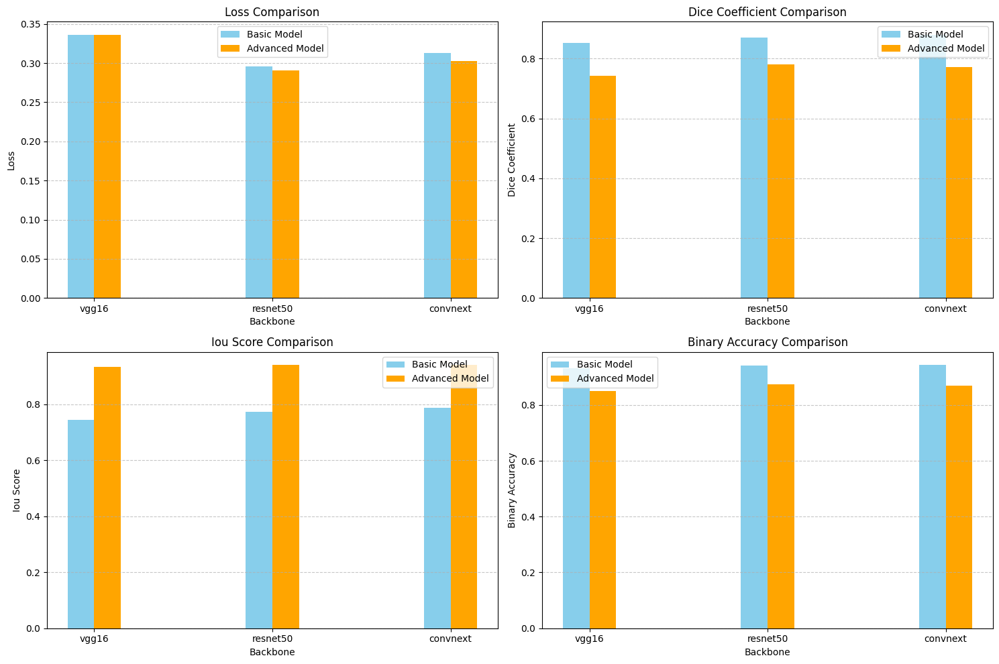


Conclusions:
1. Best Overall Model: Basic convnext (Dice Coefficient: 0.8794)
2. Best Basic Backbone: convnext
3. Best Advanced Backbone: resnet50
4. Advanced models improved performance by 4.10% on average
5. Specific Observations:
   - vgg16: Advanced model decreased Dice coefficient by 12.79%
   - resnet50: Advanced model decreased Dice coefficient by 10.34%
   - convnext: Advanced model decreased Dice coefficient by 12.18%


In [ ]:
def compare_models(basic_results, advanced_results):
    """
    Compare performance of basic and advanced models.

    Args:
        basic_results: Evaluation results for basic models
        advanced_results: Evaluation results for advanced models
    """
    # Create comparison table
    metrics = ['loss', 'dice_coefficient', 'iou_score', 'binary_accuracy']
    backbones = ['vgg16', 'resnet50', 'convnext']

    # Create DataFrame
    data = []
    for backbone in backbones:
        basic_row = [backbone, 'Basic']
        advanced_row = [backbone, 'Advanced']

        for metric in metrics:
            basic_row.append(basic_results[backbone][metric])
            advanced_row.append(advanced_results[backbone][metric])

        data.append(basic_row)
        data.append(advanced_row)

    df = pd.DataFrame(
        data,
        columns=['Backbone', 'Model Type'] + [m.replace('_', ' ').title() for m in metrics]
    )

    # Print table
    print("Model Comparison:")
    print(df.to_string(index=False))

    # Create bar chart
    plt.figure(figsize=(15, 10))

    bar_width = 0.15
    index = np.arange(len(backbones))

    for i, metric in enumerate(metrics):
        plt.subplot(2, 2, i+1)

        basic_values = [basic_results[b][metric] for b in backbones]
        advanced_values = [advanced_results[b][metric] for b in backbones]

        plt.bar(
            index - bar_width/2,
            basic_values,
            bar_width,
            label='Basic Model',
            color='skyblue'
        )
        plt.bar(
            index + bar_width/2,
            advanced_values,
            bar_width,
            label='Advanced Model',
            color='orange'
        )

        plt.xlabel('Backbone')
        plt.ylabel(metric.replace('_', ' ').title())
        plt.title(f'{metric.replace("_", " ").title()} Comparison')
        plt.xticks(index, backbones)
        plt.legend()
        plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig('model_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Draw conclusions
    print("\nConclusions:")

    # Find best model overall
    best_dice = 0
    best_model = None

    for backbone in backbones:
        basic_dice = basic_results[backbone]['dice_coefficient']
        advanced_dice = advanced_results[backbone]['dice_coefficient']

        if basic_dice > best_dice:
            best_dice = basic_dice
            best_model = f"Basic {backbone}"

        if advanced_dice > best_dice:
            best_dice = advanced_dice
            best_model = f"Advanced {backbone}"

    print(f"1. Best Overall Model: {best_model} (Dice Coefficient: {best_dice:.4f})")

    # Compare backbones
    avg_basic = {
        backbone: np.mean([
            basic_results[backbone]['dice_coefficient'],
            basic_results[backbone]['iou_score']
        ]) for backbone in backbones
    }

    avg_advanced = {
        backbone: np.mean([
            advanced_results[backbone]['dice_coefficient'],
            advanced_results[backbone]['iou_score']
        ]) for backbone in backbones
    }

    best_basic_backbone = max(avg_basic, key=avg_basic.get)
    best_advanced_backbone = max(avg_advanced, key=avg_advanced.get)

    print(f"2. Best Basic Backbone: {best_basic_backbone}")
    print(f"3. Best Advanced Backbone: {best_advanced_backbone}")

    # Compare basic vs advanced
    basic_avg = np.mean([avg_basic[b] for b in backbones])
    advanced_avg = np.mean([avg_advanced[b] for b in backbones])

    improvement = ((advanced_avg - basic_avg) / basic_avg) * 100

    print(f"4. Advanced models improved performance by {improvement:.2f}% on average")

    # Specific observations
    print("5. Specific Observations:")
    for backbone in backbones:
        basic_dice = basic_results[backbone]['dice_coefficient']
        advanced_dice = advanced_results[backbone]['dice_coefficient']

        dice_diff = ((advanced_dice - basic_dice) / basic_dice) * 100

        print(f"   - {backbone}: Advanced model {'improved' if dice_diff > 0 else 'decreased'} "
              f"Dice coefficient by {abs(dice_diff):.2f}%")

# Compare all models
compare_models(evaluation_results, advanced_evaluation_results)
